In [13]:
library(dplyr)   
library(caret)
library(tidyverse)

load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_finale.Rdata")

options(repr.plot.width = 20, repr.plot.height =10, repr.plot.res = 500)

load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_iniziale.Rdata")
df <- DatiUsati1
rm(DatiUsati1)

In [14]:
df <- df[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps","leastOneEpathenal",
           "leastOneSpontaneousBacterial","thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","CristalloidiComp","ColloidiComp","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "scoreCHILD","organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

In [15]:
aggregate(sapply(df,class), by=list(sapply(df,class)), FUN=length)

Group.1,x
character,3
Date,1
factor,90
numeric,31


In [16]:
colnames(select_if(df, function(col) is.character(col)))

[1] "patientKey"             "icuAdmDate__icuAdmTime" "centreCode"

In [17]:
df$CentreCode <- as.factor(df$centreCode)

In [18]:
df1 <- df %>% filter(degenzaPostTraOSP <= 8)

df2 <- df %>% filter(degenzaPostTraOSP > 8 & degenzaPostTraOSP <= 18)

In [19]:
paste("I pazienti con degenza minore di 8 giorni sono", nrow(df1))
paste("I pazienti con degenza compresa tra 9 e 18 giorni sono", nrow(df2))

[1] "I pazienti con degenza minore di 8 giorni sono 157"

[1] "I pazienti con degenza compresa tra 9 e 18 giorni sono 560"

In [20]:
# Data

print("<= 8")
summary(df1$icuAdmDate__icuAdmDate)

print("<= 18")
summary(df2$icuAdmDate__icuAdmDate)

[1] "<= 8"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-10-23" "2020-01-22" "2020-12-22" "2020-09-21" "2021-06-04" "2021-12-15"

[1] "<= 18"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-10-11" "2019-11-15" "2020-08-24" "2020-08-10" "2021-05-13" "2021-12-31"

In [21]:
# Orario (è una variabile "character" quindi posso confrontare solo in questo modo senza fare ulteriori modifche)

print("<= 8")
table(df1$icuAdmDate__icuAdmTime)

print("<= 18")
table(df2$icuAdmDate__icuAdmTime)

[1] "<= 8"



00:05 00:10 00:15 00:34 01:00 01:25 01:45 01:53 02:00 02:15 02:30 02:45 03:00 
    1     1     1     1     1     1     1     1     2     1     1     1     1 
03:07 03:10 03:43 04:00 04:30 05:10 05:15 06:25 06:30 09:30 10:00 10:10 11:30 
    1     1     1     1     2     1     1     1     1     1     1     1     1 
11:58 12:00 12:05 12:15 12:21 12:32 12:42 12:58 13:02 13:10 13:27 13:52 13:55 
    1     1     1     1     1     1     1     1     2     1     1     2     1 
13:56 13:57 14:00 14:04 14:10 14:11 14:12 14:13 14:15 14:16 14:17 14:18 14:30 
    1     2     4     1     1     1     1     1     2     1     1     1     1 
14:35 14:36 14:39 14:40 14:54 14:56 14:57 15:00 15:05 15:08 15:10 15:13 15:17 
    1     1     1     2     2     1     1     4     1     1     1     2     1 
15:20 15:25 15:41 15:46 15:48 15:54 16:00 16:02 16:16 16:22 16:26 16:29 16:30 
    2     1     1     1     1     1     3     1     1     1     1     1     1 
16:38 16:44 16:51 16:52 16:59 17:00 17:05 17:30 17:

[1] "<= 18"



00:10 00:15 00:20 00:28 00:30 00:35 00:45 00:50 01:00 01:15 01:23 01:24 01:29 
    1     2     1     1     2     1     1     1     3     1     1     1     1 
01:30 01:35 01:45 01:50 01:57 02:00 02:10 02:15 02:28 02:30 02:40 02:49 03:00 
    3     1     2     1     1     4     2     1     1     1     1     1     2 
03:18 03:30 03:36 03:45 03:50 03:53 03:56 04:00 04:15 04:30 04:33 04:35 04:36 
    1     2     1     1     2     1     1     3     1     3     1     1     1 
04:56 05:00 05:18 05:50 05:53 06:00 06:13 06:30 06:45 06:59 07:00 07:27 07:33 
    1     2     1     1     1     2     1     1     2     1     2     1     1 
08:00 08:30 08:49 08:50 09:42 10:00 10:03 10:04 10:30 11:00 11:19 11:24 11:30 
    2     3     1     1     1     8     1     1     1     4     2     1     1 
11:40 11:43 11:55 11:57 12:00 12:03 12:10 12:26 12:30 12:31 12:35 12:36 12:50 
    1     1     1     1     9     1     1     1     2     1     1     2     1 
13:00 13:04 13:11 13:12 13:13 13:15 13:16 13:30 13:

In [33]:
descrittiva_discrete <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {
            
            par(mfrow=c(1,2))
            print("<= 8")
            print(table(df1[[column]]))
            barplot(table(df1[[column]]), main="<= 8", col="blue", ylim = c(0, 500))

            print("<= 18")
            print(table(df2[[column]]))
            barplot(table(df2[[column]]), main="<= 18", col="blue", ylim = c(0, 500))
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
        }
        
}




descrittiva_continue <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {

            par(mfrow=c(1,2))

            print("<= 8")
            print(summary(df1[[column]]))
            hist(df1[[column]], main="<= 8", col="blue",ylim= c(0,500))

            print("<= 18")
            print(summary(df2[[column]]))
            hist(df2[[column]], main="<= 18", col="blue", ylim = c(0, 500))
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
        }
}

In [23]:
df_discrete1 <- select_if(df1, function(col) is.factor(col))
df_discrete2 <- select_if(df2, function(col) is.factor(col))
                          
                          
df_continue1 <- select_if(df1, function(col) is.numeric(col))
df_continue2 <- select_if(df2, function(col) is.numeric(col))

[1] "<= 8"

  Male Female 
   127     30 
[1] "<= 18"

  Male Female 
   388    172 
[1] "<= 8"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
          64           87            1            1            3            0 
[1] "<= 18"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
         130          387            4            4           34            0 


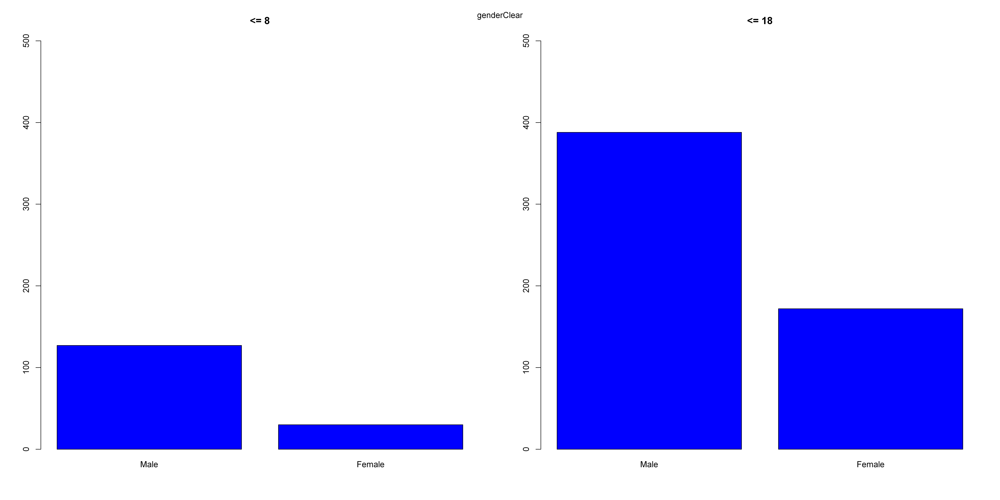

[1] "<= 8"

  nonSurgical electSurgical emergSurgical 
            0            13           144 
[1] "<= 18"

  nonSurgical electSurgical emergSurgical 
            8            51           501 


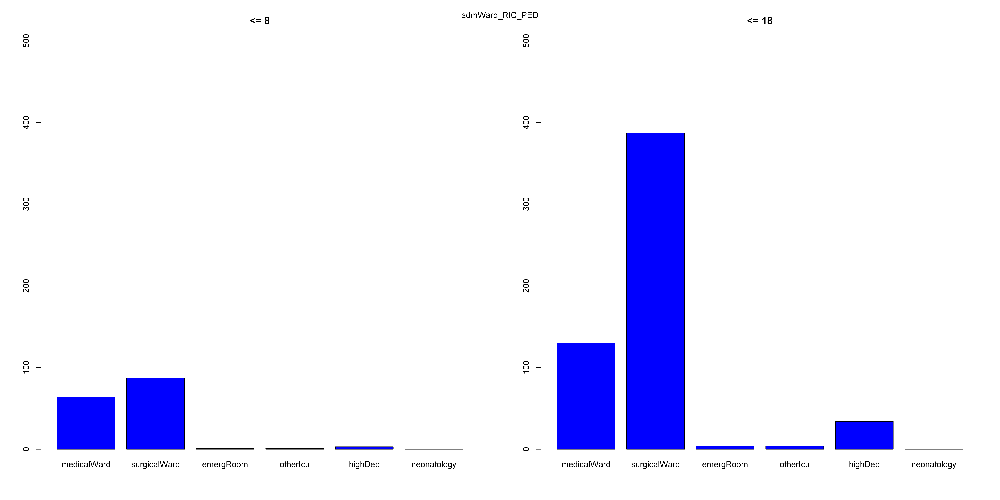

[1] "<= 8"

 responsNo responsYes 
       153          4 
[1] "<= 18"

 responsNo responsYes 
       542         18 


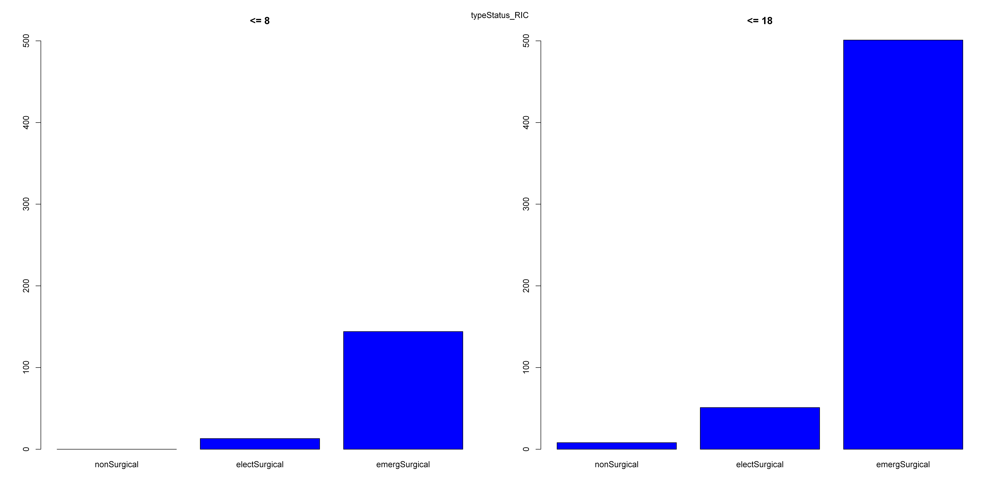

[1] "<= 8"

 responsNo responsYes 
       156          1 
[1] "<= 18"

 responsNo responsYes 
       544         16 


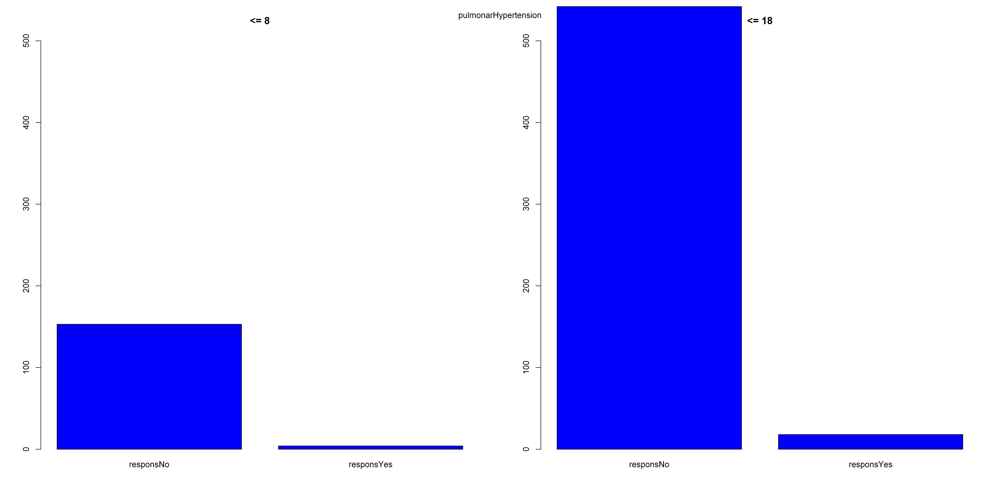

[1] "<= 8"

 responsNo responsYes 
       134         23 
[1] "<= 18"

 responsNo responsYes 
       455        105 


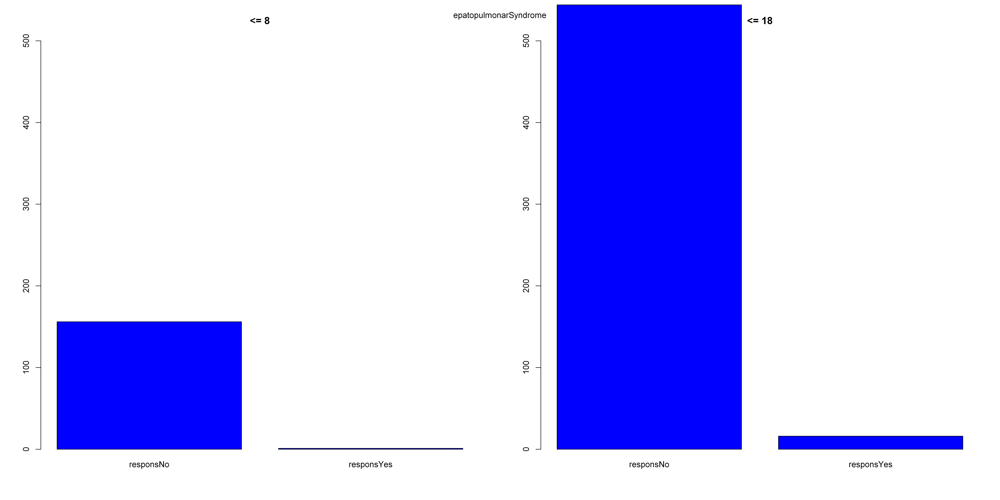

[1] "<= 8"

 responsNo responsYes 
       150          7 
[1] "<= 18"

 responsNo responsYes 
       546         14 


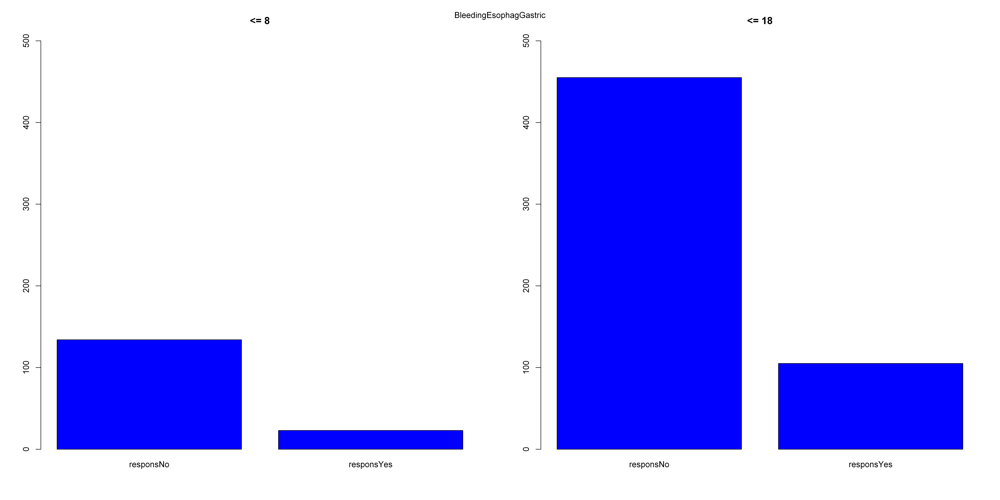

[1] "<= 8"

priority     mild   severe notLevel 
       9       17       10      121 
[1] "<= 18"

priority     mild   severe notLevel 
      41       95       86      338 


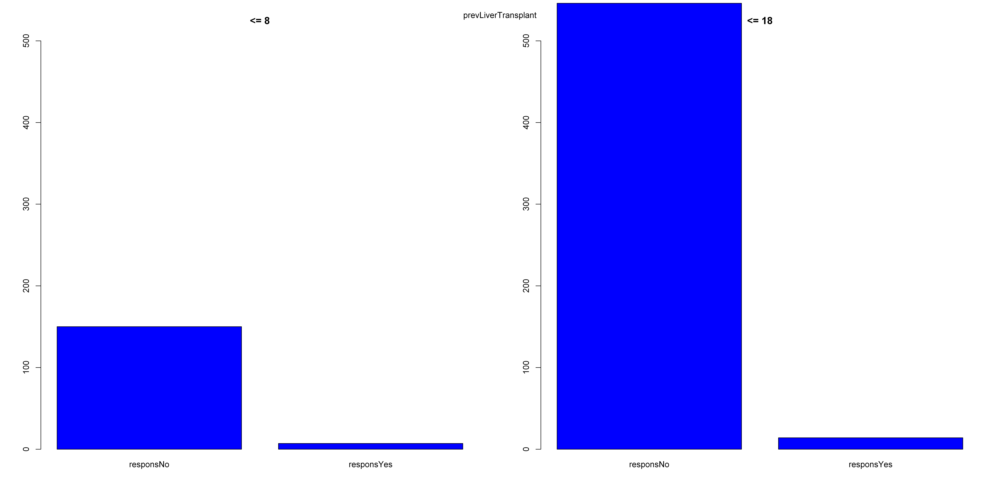

[1] "<= 8"

 responsNo responsYes 
       138         19 
[1] "<= 18"

 responsNo responsYes 
       510         50 


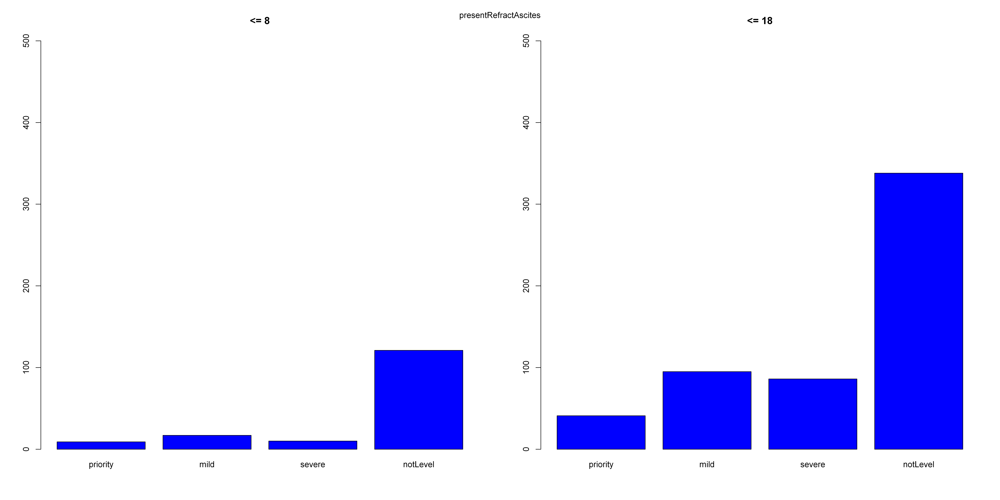

[1] "<= 8"

      respNo respPrevious   respEffect 
         146            8            3 
[1] "<= 18"

      respNo respPrevious   respEffect 
         506           28           26 


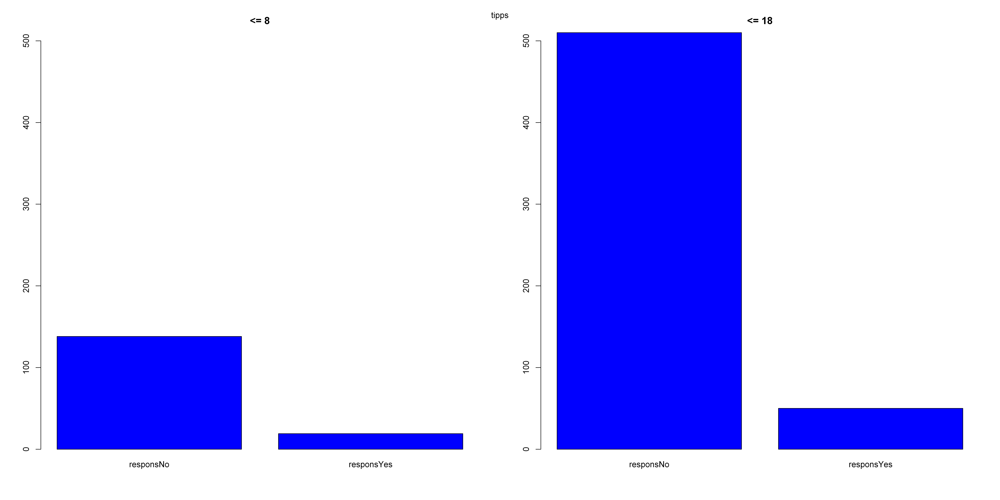

[1] "<= 8"

      respNo respPrevious   respEffect 
         148            8            1 
[1] "<= 18"

      respNo respPrevious   respEffect 
         503           55            2 


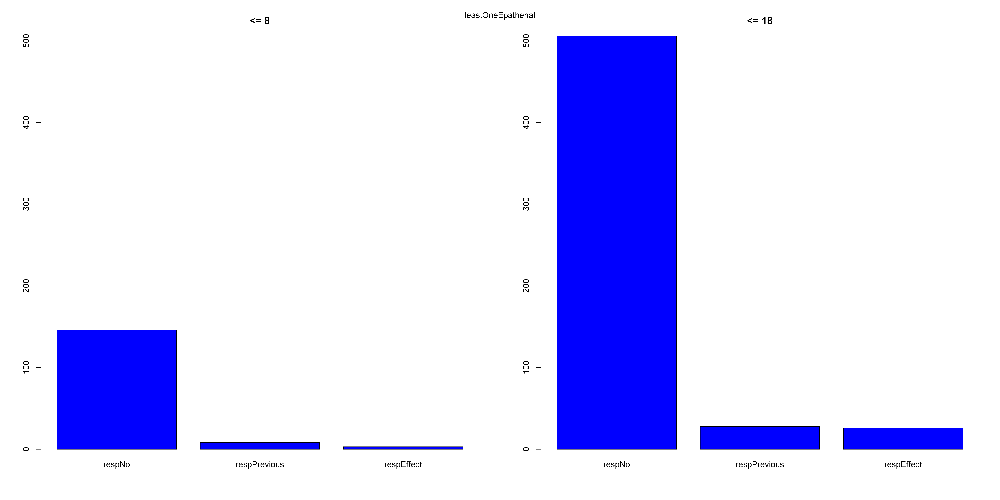

[1] "<= 8"

  degreeI  degreeII degreeIII  degreeIV      None 
       13         4         4         0       136 
[1] "<= 18"

  degreeI  degreeII degreeIII  degreeIV      None 
       38        33         9         5       475 


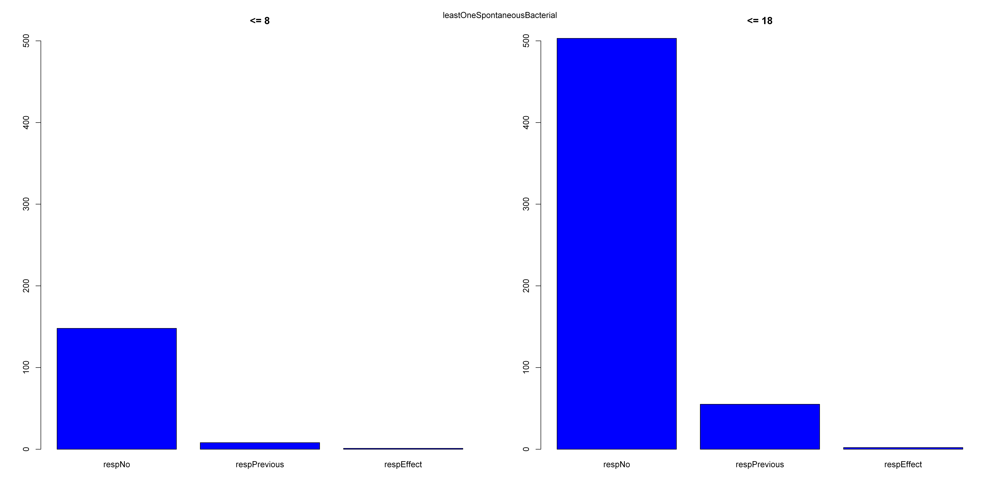

[1] "<= 8"

      respNo respPrevious   respEffect 
         135           16            6 
[1] "<= 18"

      respNo respPrevious   respEffect 
         433           97           30 


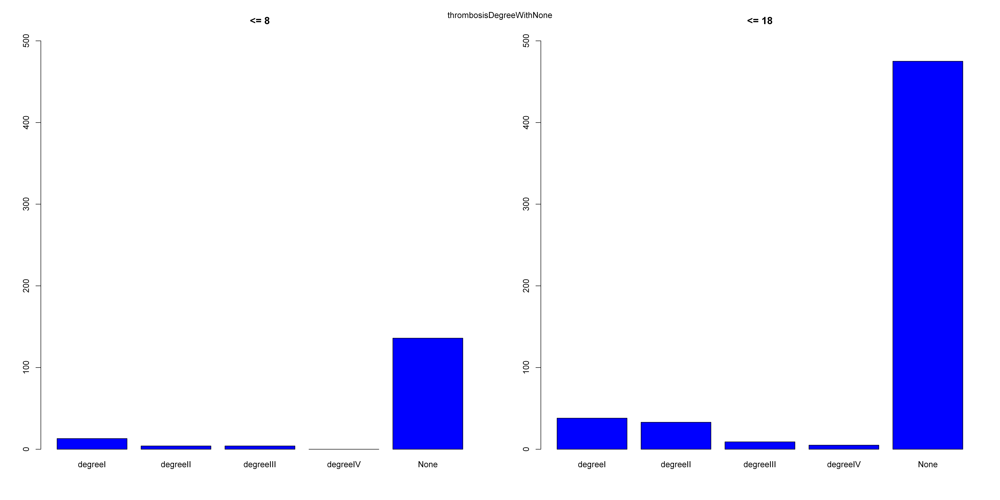

[1] "<= 8"

 slightComprom SeriousComprom 
           148              9 
[1] "<= 18"

 slightComprom SeriousComprom 
           524             36 


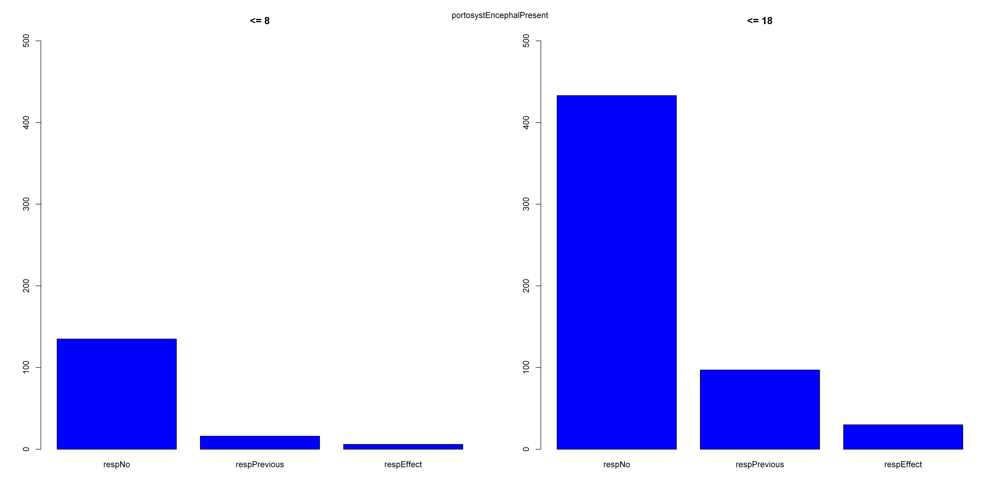

[1] "<= 8"

 responsNo responsYes 
       118         39 
[1] "<= 18"

 responsNo responsYes 
       398        162 


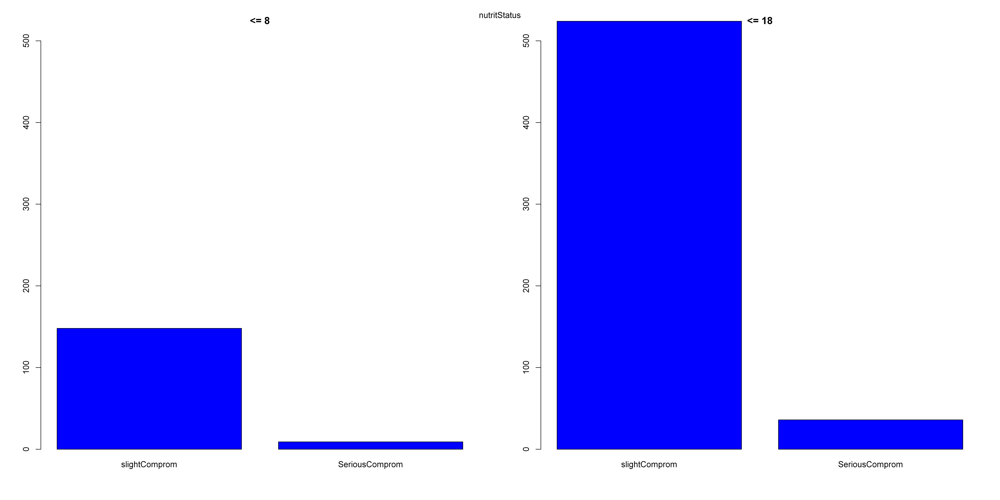

[1] "<= 8"

 responsNo responsYes 
       148          9 
[1] "<= 18"

 responsNo responsYes 
       491         69 


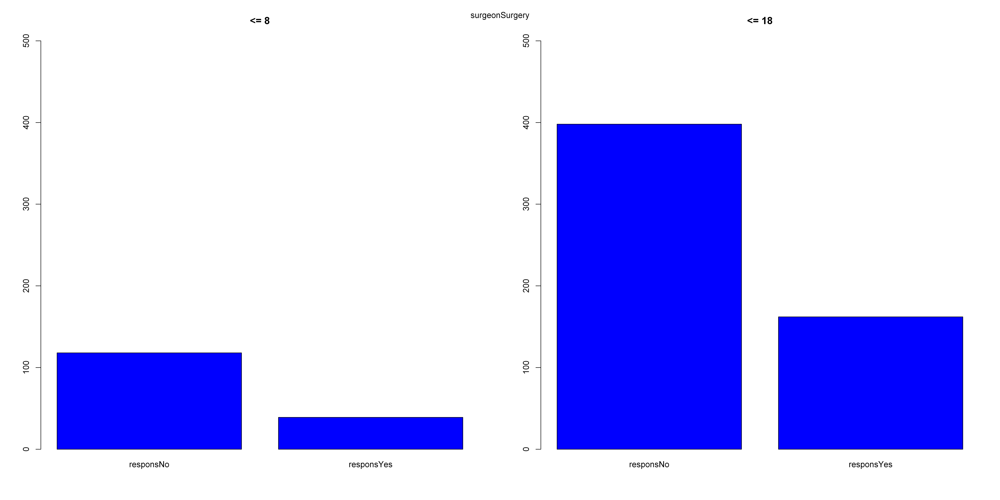

[1] "<= 8"

         nomale             MAP  dopamineEqual5  dopamineGreat5 dopamineGreat15 
            149               4               0               3               1 
[1] "<= 18"

         nomale             MAP  dopamineEqual5  dopamineGreat5 dopamineGreat15 
            534              11               3               7               5 


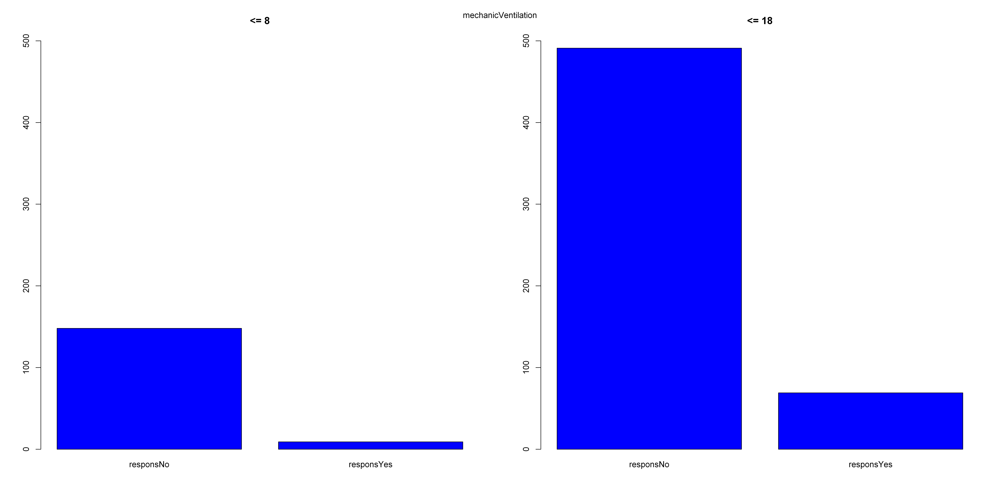

[1] "<= 8"

 responsNo responsYes 
       146         11 
[1] "<= 18"

 responsNo responsYes 
       475         85 


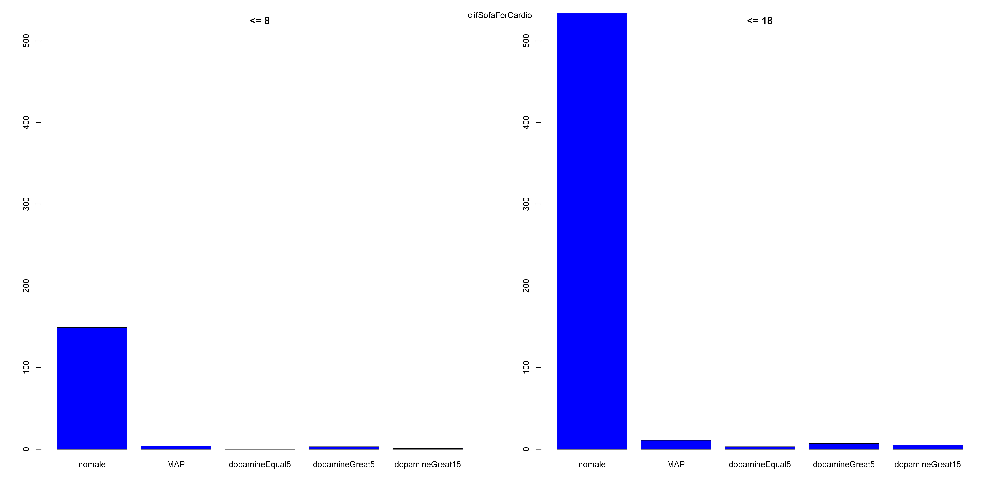

[1] "<= 8"

notLevel     mild moderate   severe 
      50       78       21        8 
[1] "<= 18"

notLevel     mild moderate   severe 
     190      230      111       29 


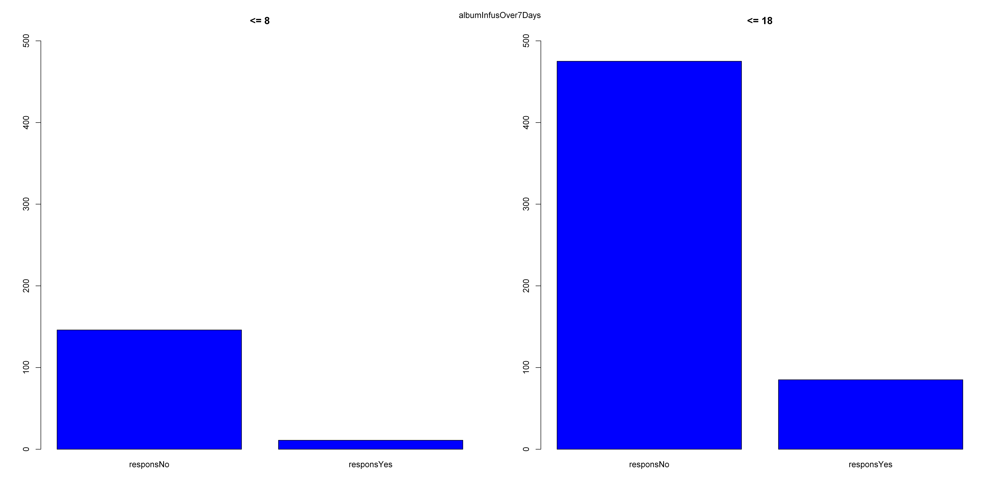

[1] "<= 8"

 responsNo responsYes 
       152          5 
[1] "<= 18"

 responsNo responsYes 
       551          9 


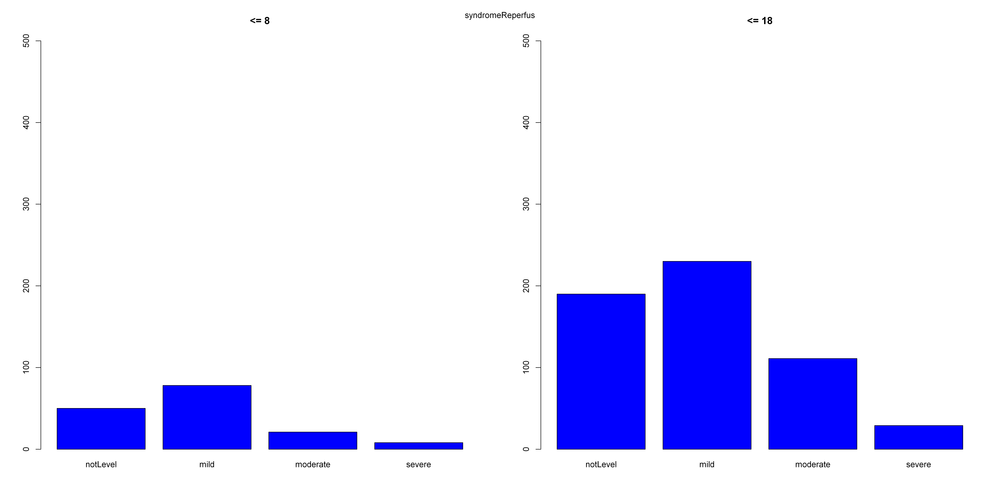

[1] "<= 8"

     piggyBack       standard secondBelghiti 
           138             17              2 
[1] "<= 18"

     piggyBack       standard secondBelghiti 
           504             51              5 


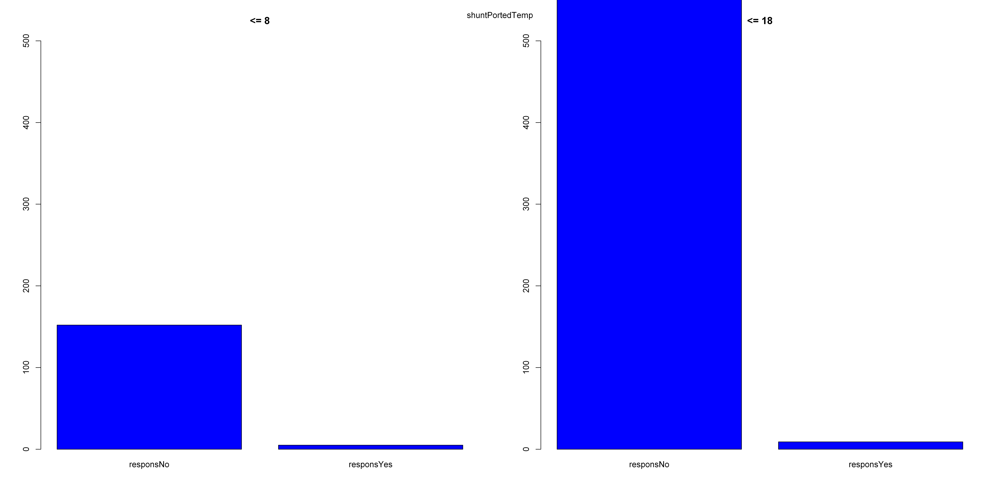

[1] "<= 8"

 responsNo responsYes 
       156          1 
[1] "<= 18"

 responsNo responsYes 
       551          9 


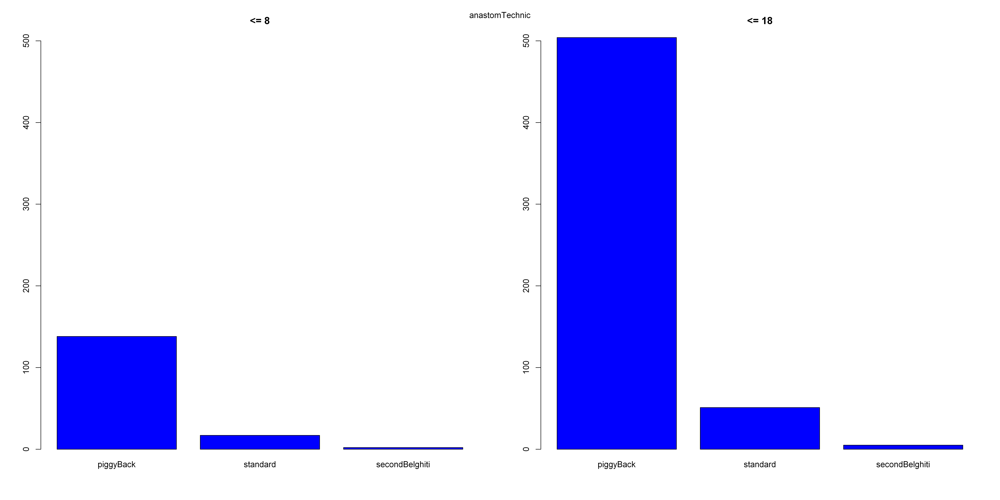

[1] "<= 8"

   coledWithKehr coledWithoutKehr   coledoDigiunal         derivExt 
              77               57               22                1 
[1] "<= 18"

   coledWithKehr coledWithoutKehr   coledoDigiunal         derivExt 
             290              212               51                7 


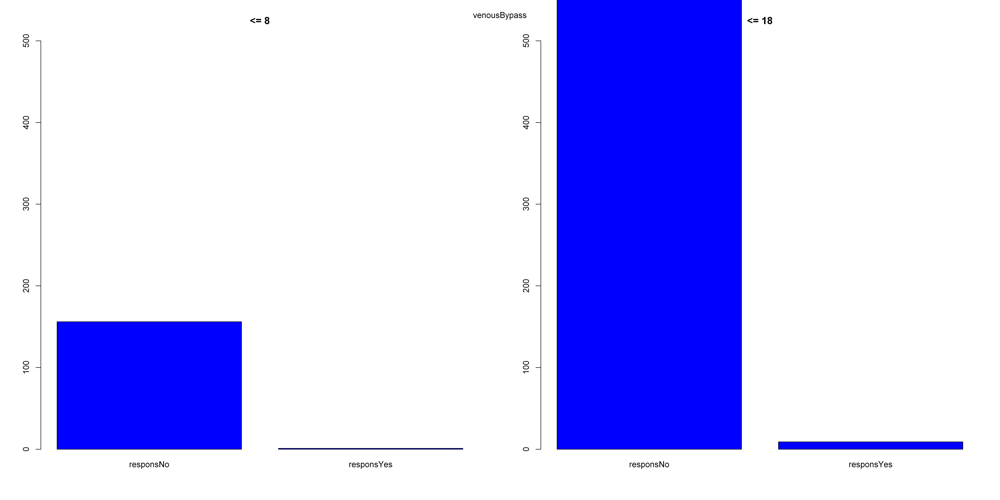

[1] "<= 8"

 responsNo responsYes 
       155          2 
[1] "<= 18"

 responsNo responsYes 
       548         12 


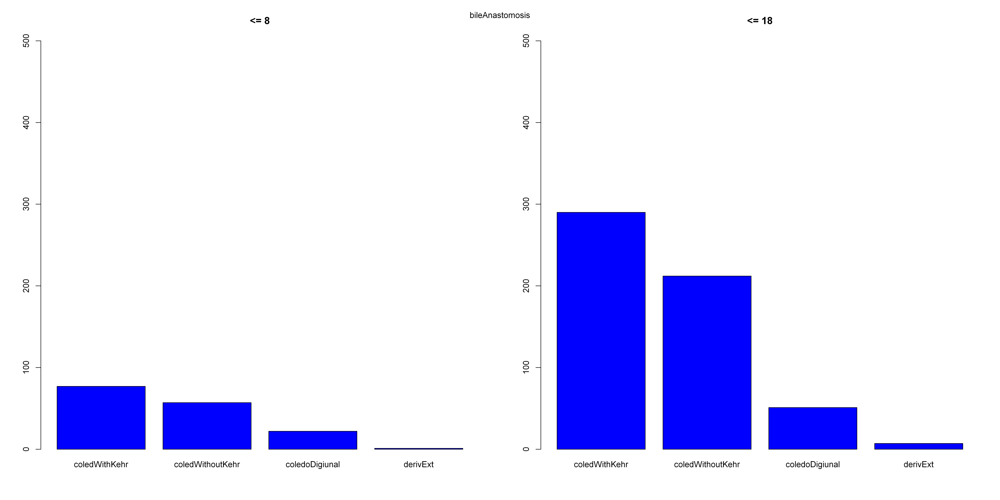

[1] "<= 8"

ChildA ChildB ChildC 
   119     35      3 
[1] "<= 18"

ChildA ChildB ChildC 
   325    197     38 


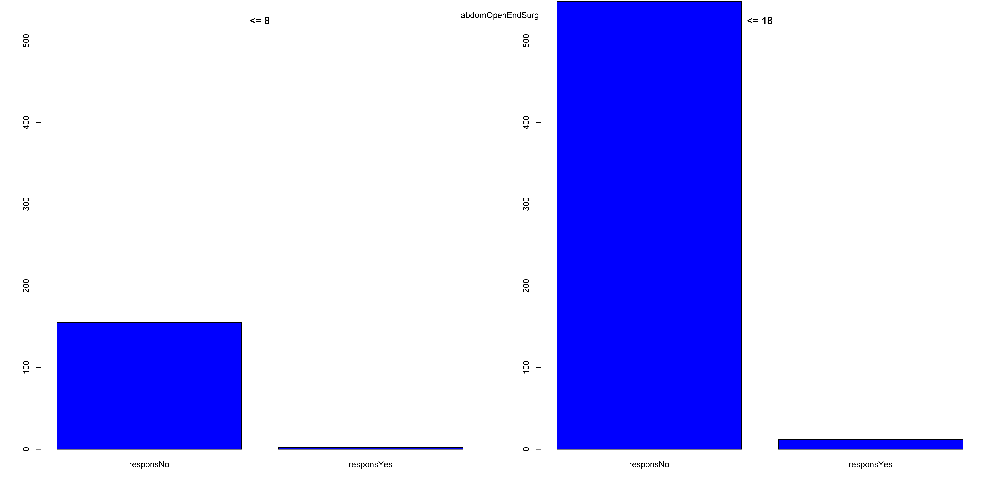

[1] "<= 8"

alive  dead 
   71    86 
[1] "<= 18"

alive  dead 
  241   319 


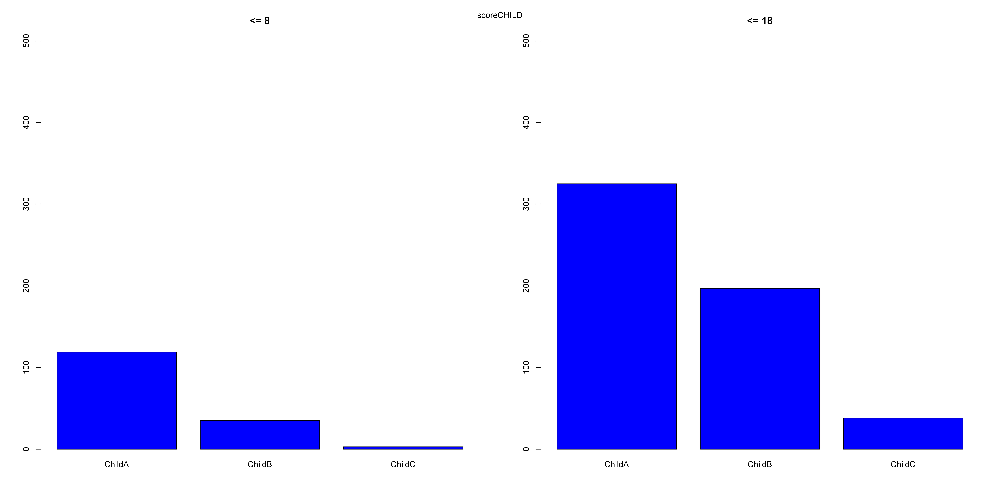

[1] "<= 8"

   typeBDD    typeDCD typeLiving typeDomino 
       127         23          7          0 
[1] "<= 18"

   typeBDD    typeDCD typeLiving typeDomino 
       507         49          3          1 


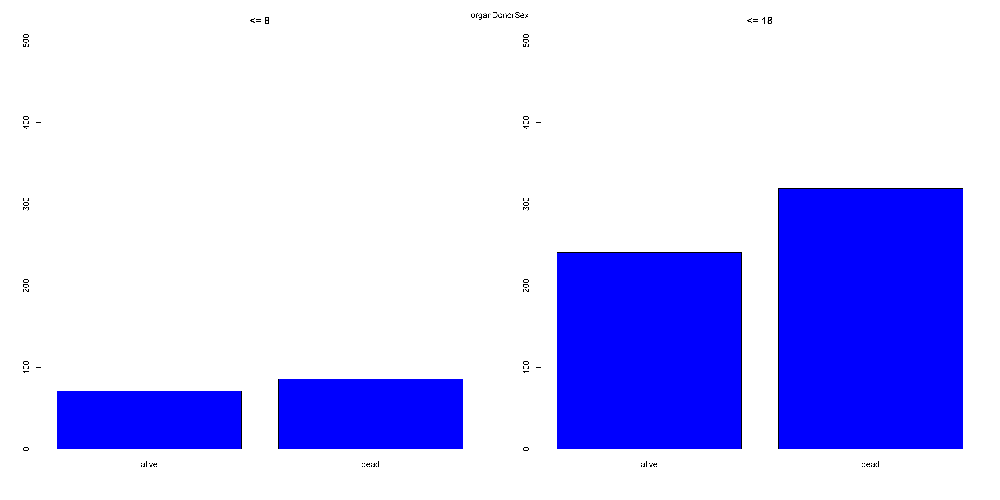

[1] "<= 8"

wholeOrgan splitRight  splitLeft 
       148          8          1 
[1] "<= 18"

wholeOrgan splitRight  splitLeft 
       549          9          2 


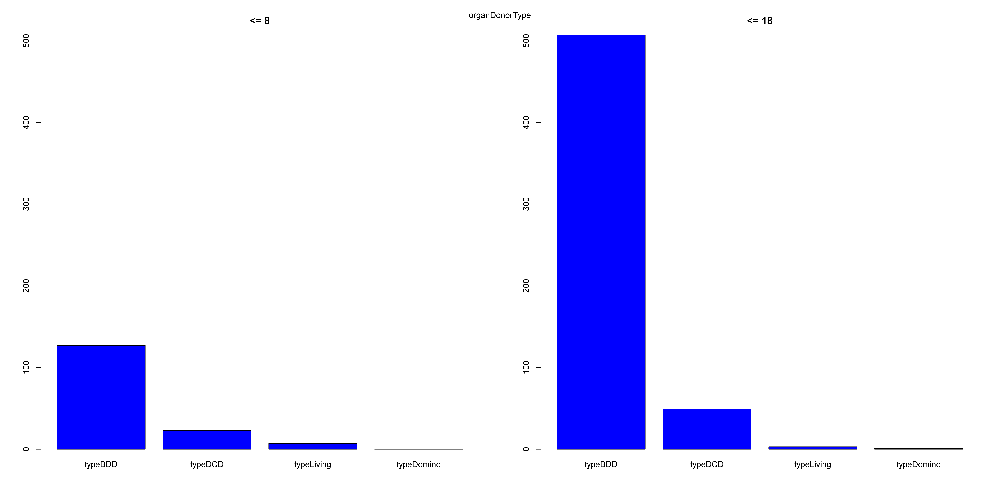

[1] "<= 8"

 responsNo responsYes 
       143         14 
[1] "<= 18"

 responsNo responsYes 
       528         32 


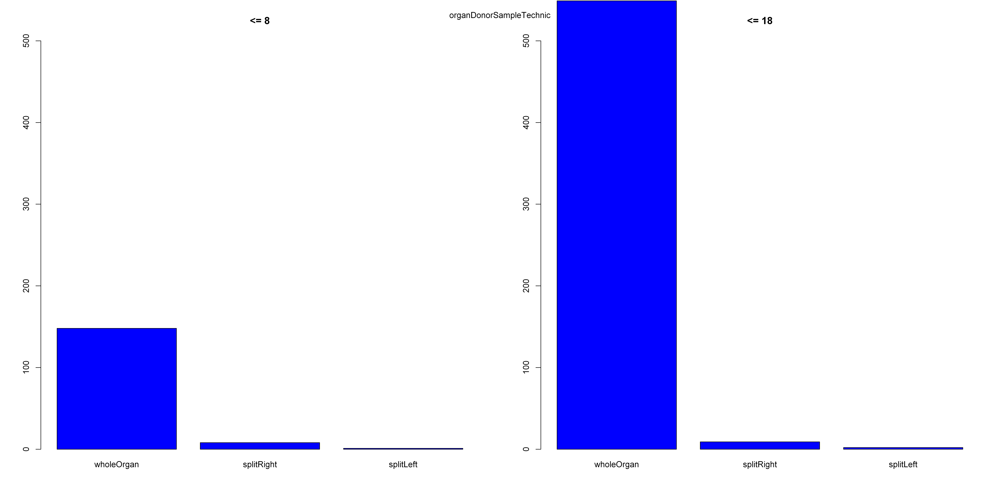

[1] "<= 8"

 responsNo responsYes 
       135         22 
[1] "<= 18"

 responsNo responsYes 
       484         76 


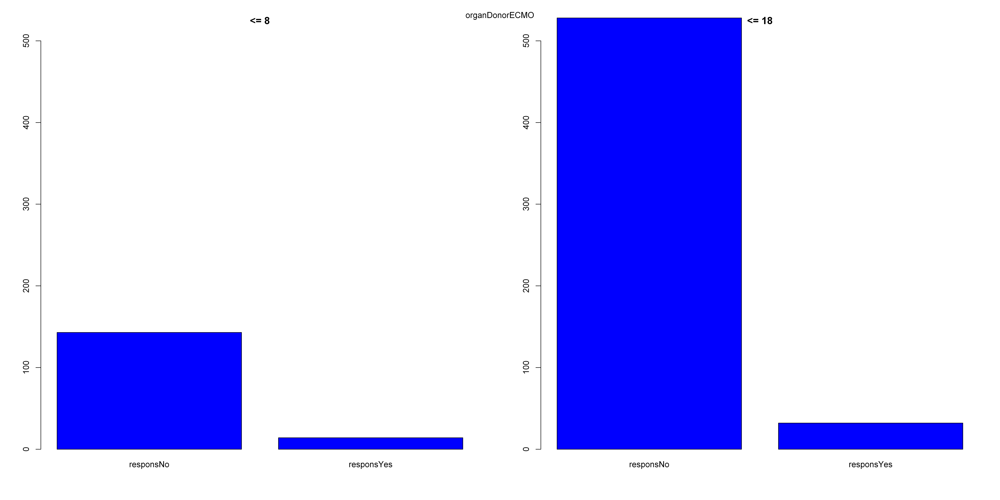

[1] "<= 8"

          notPerformed           notAvailable macroscopicFattyTissue 
                    39                     12                    106 
[1] "<= 18"

          notPerformed           notAvailable macroscopicFattyTissue 
                   103                     78                    379 


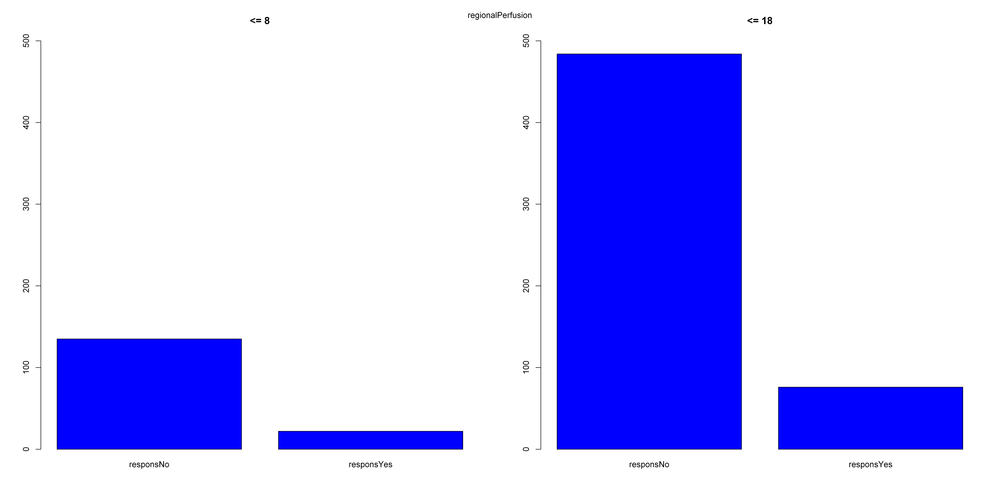

[1] "<= 8"

noRecondOrgan    Ipotermico  Normotermico 
          104            49             4 
[1] "<= 18"

noRecondOrgan    Ipotermico  Normotermico 
          430           120            10 


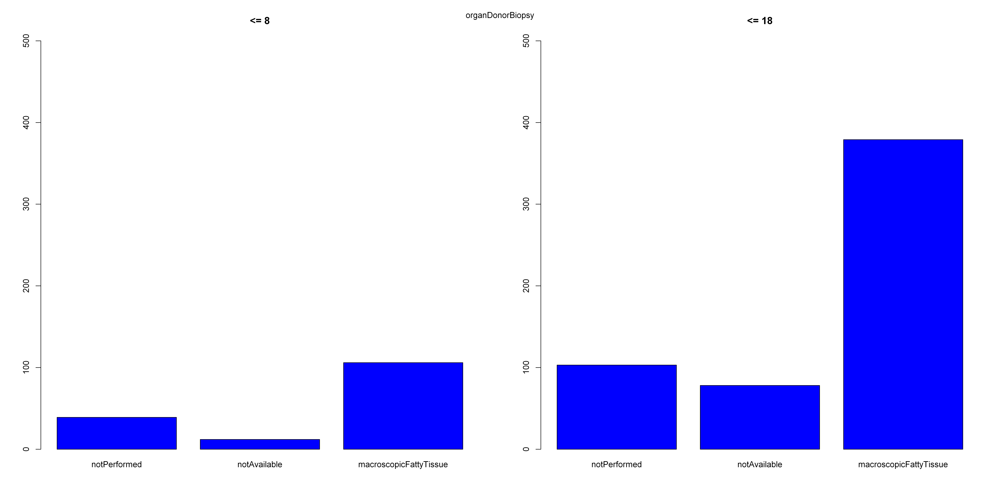

[1] "<= 8"

           Local         Regional     extraRegiona rescueAllocation 
              40               71               29               17 
[1] "<= 18"

           Local         Regional     extraRegiona rescueAllocation 
             132              233              149               46 


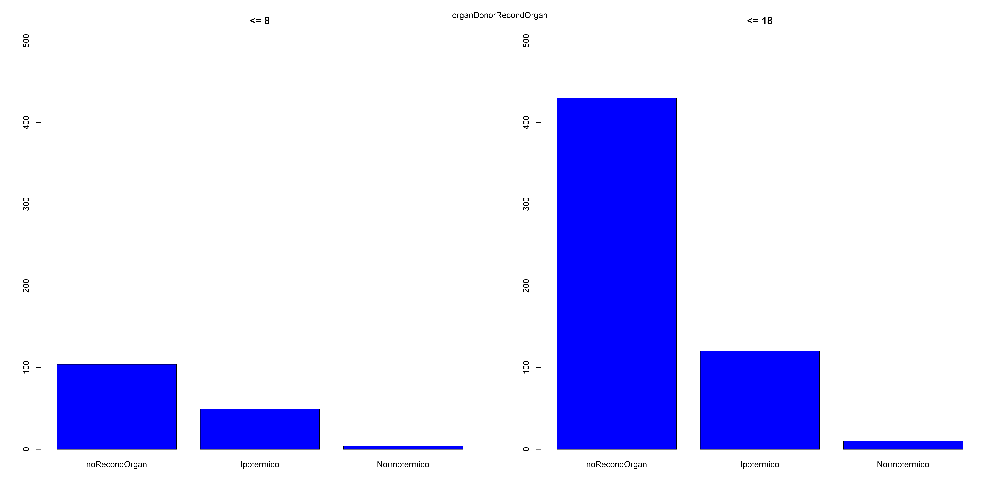

[1] "<= 8"

       Anoxia CerebAccident        Trauma  anotherCause 
           18           101            21            10 
[1] "<= 18"

       Anoxia CerebAccident        Trauma  anotherCause 
           72           357            96            32 


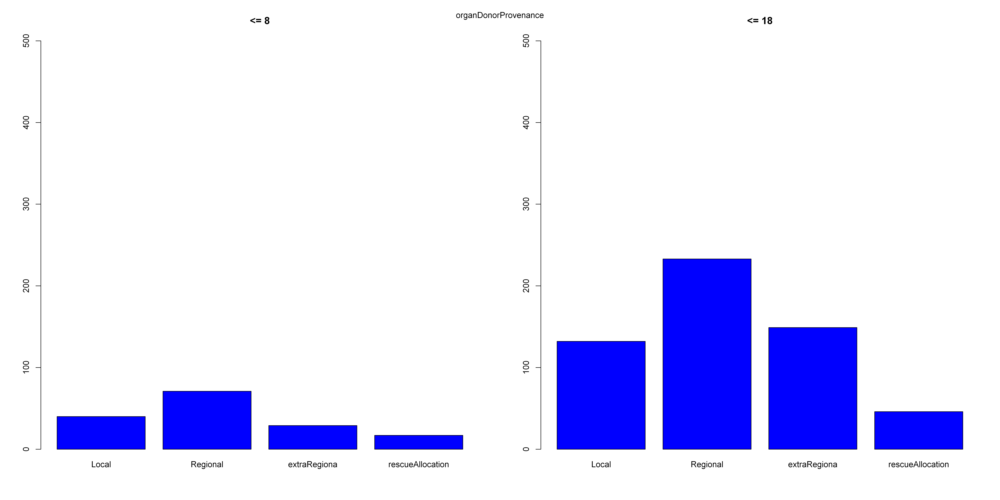

[1] "<= 8"

hospDead    alive 
      14      142 
[1] "<= 18"

hospDead    alive 
      13      547 


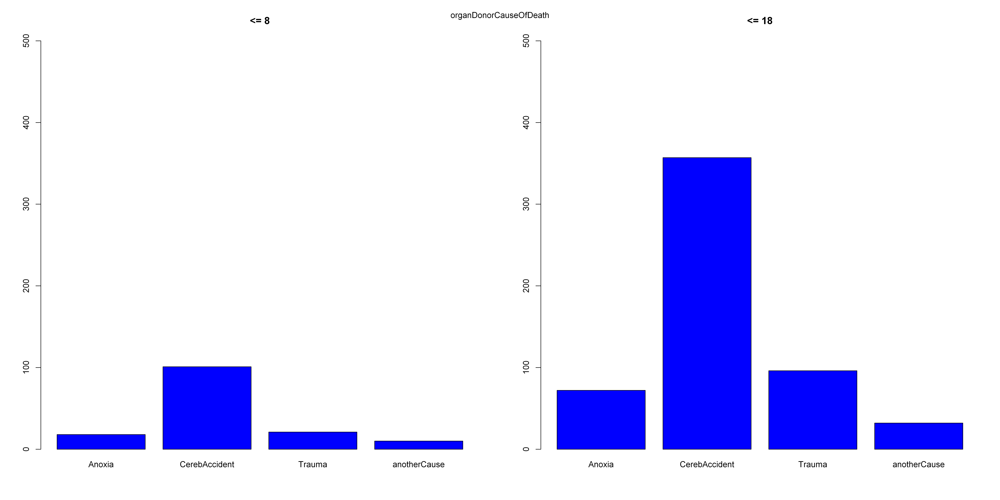

[1] "<= 8"

  1   0 
 12 144 
[1] "<= 18"

  1   0 
 10 550 


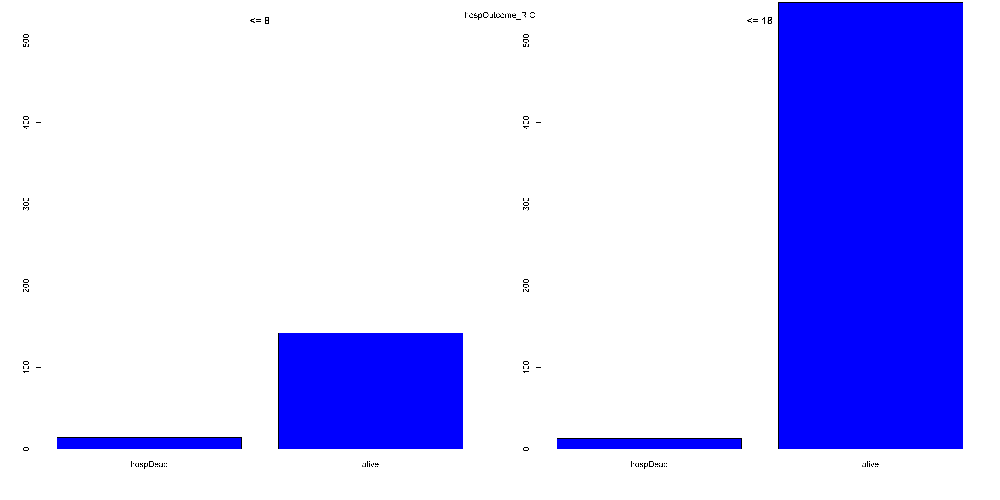

[1] "<= 8"

1 
1 
[1] "<= 18"

1 
3 


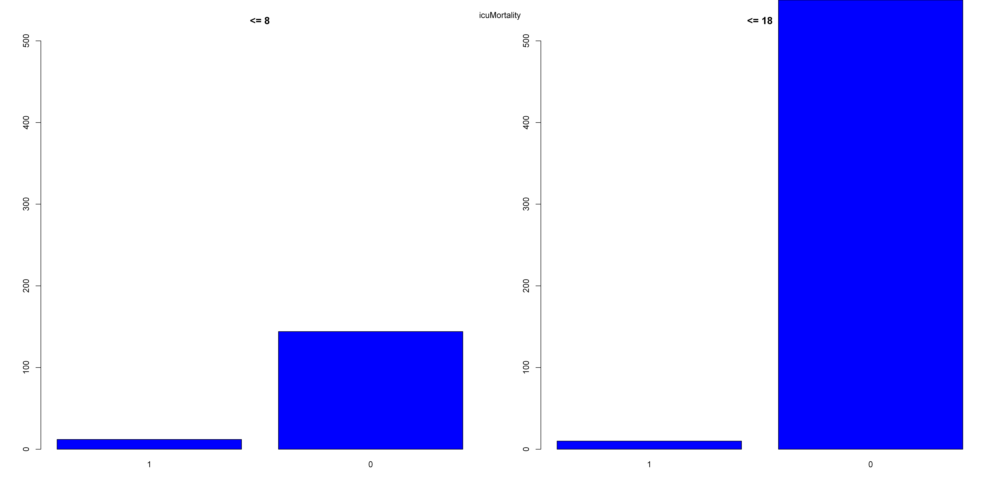

[1] "<= 8"

 1 
53 
[1] "<= 18"

  1 
194 


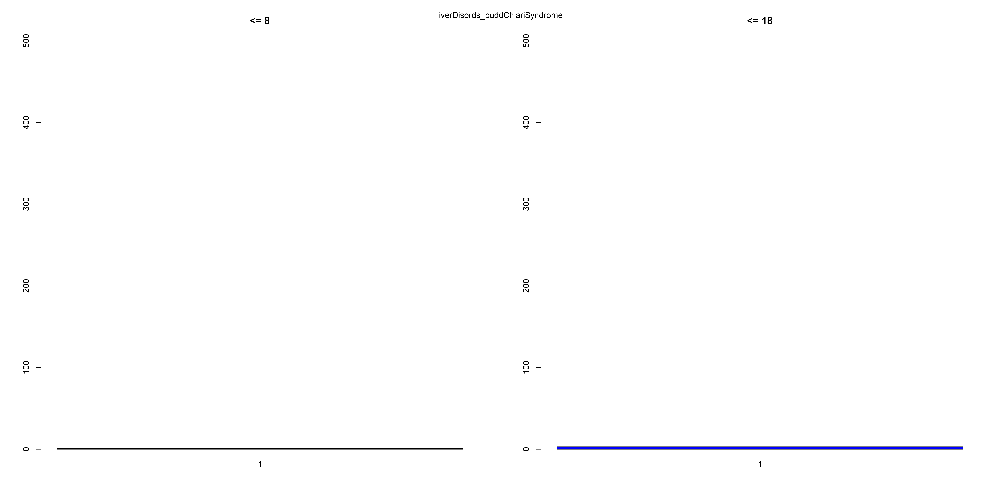

[1] "<= 8"

1 
2 
[1] "<= 18"

 1 
22 


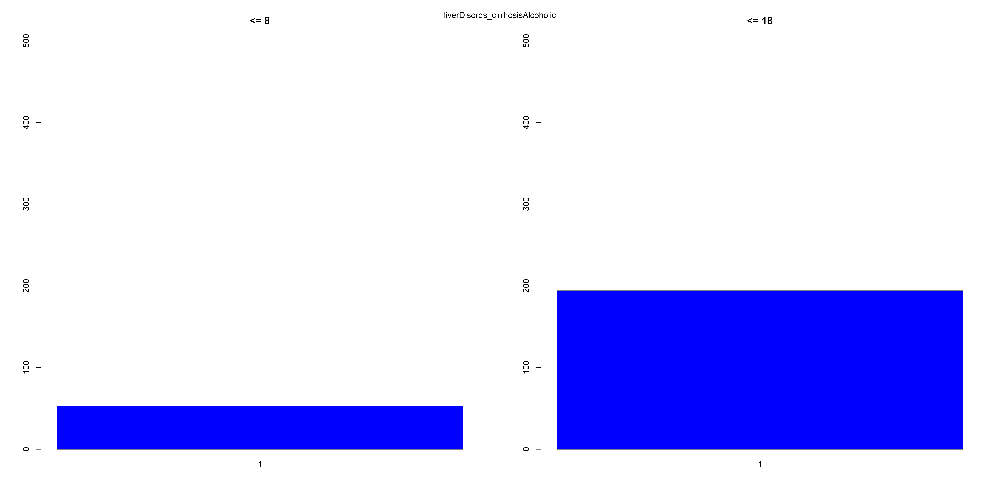

[1] "<= 8"

1 
4 
[1] "<= 18"

 1 
19 


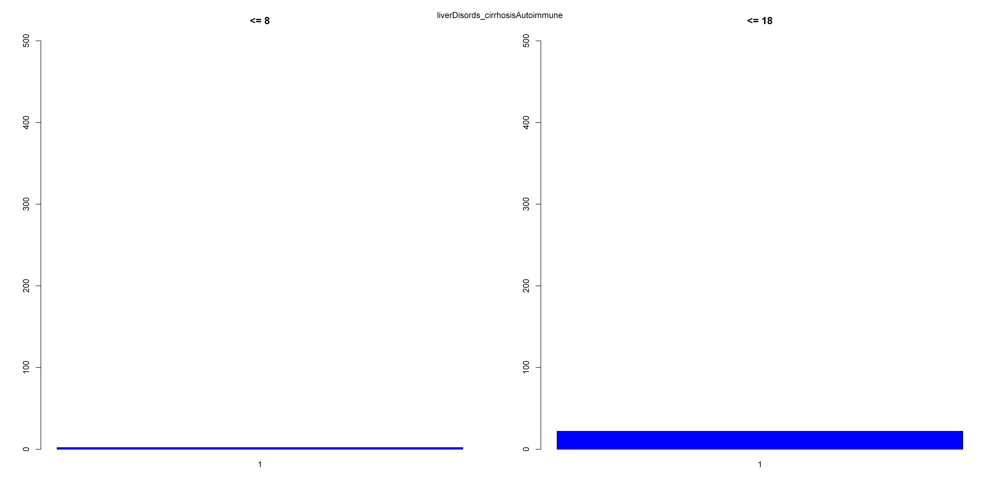

[1] "<= 8"

1 
1 
[1] "<= 18"

1 
1 


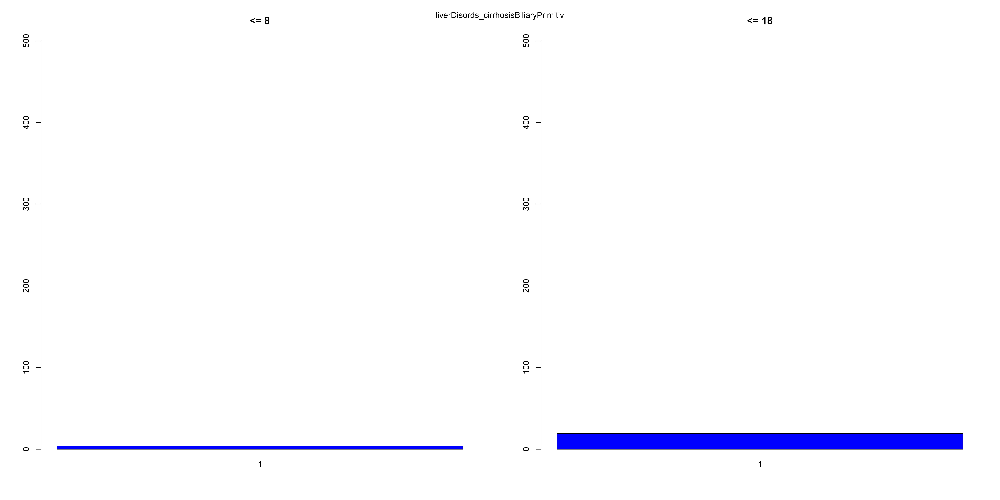

[1] "<= 8"

1 
4 
[1] "<= 18"

 1 
11 


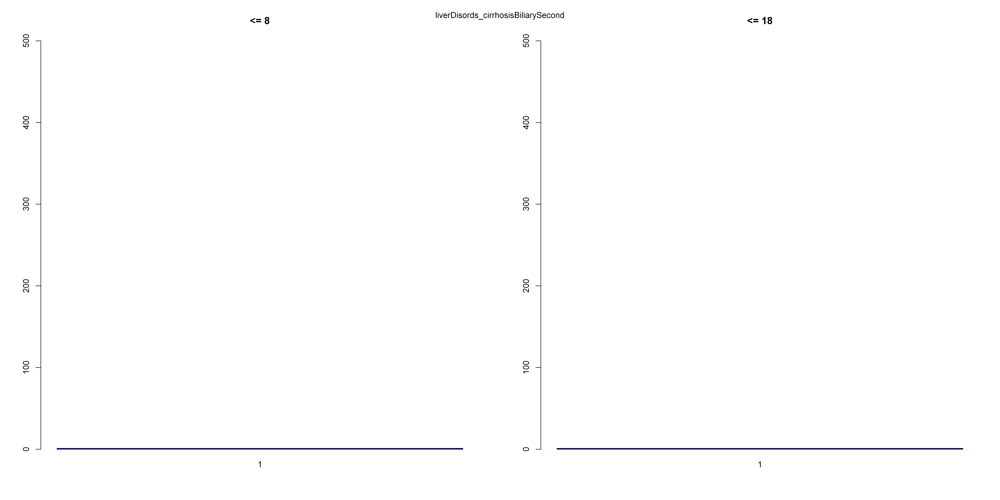

[1] "<= 8"

1 
0 
[1] "<= 18"

1 
1 


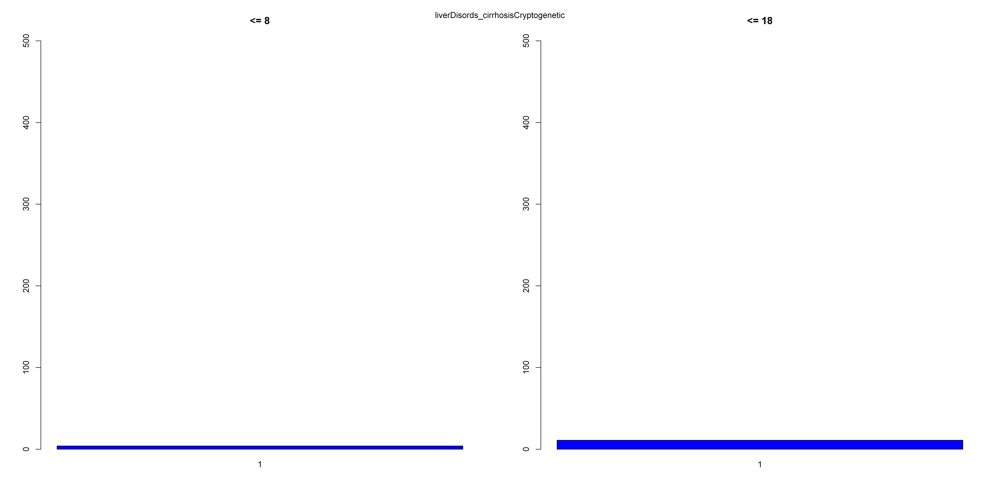

[1] "<= 8"

1 
4 
[1] "<= 18"

 1 
10 


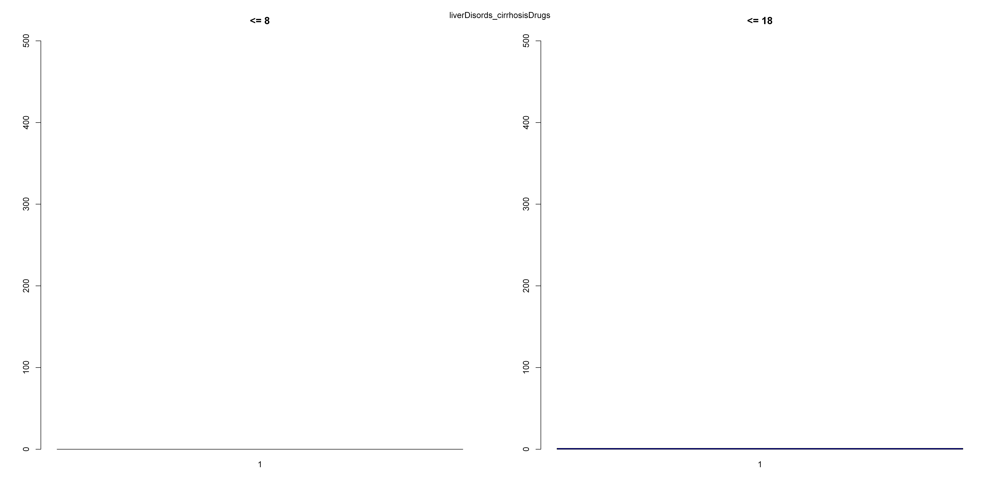

[1] "<= 8"

 1 
28 
[1] "<= 18"

 1 
93 


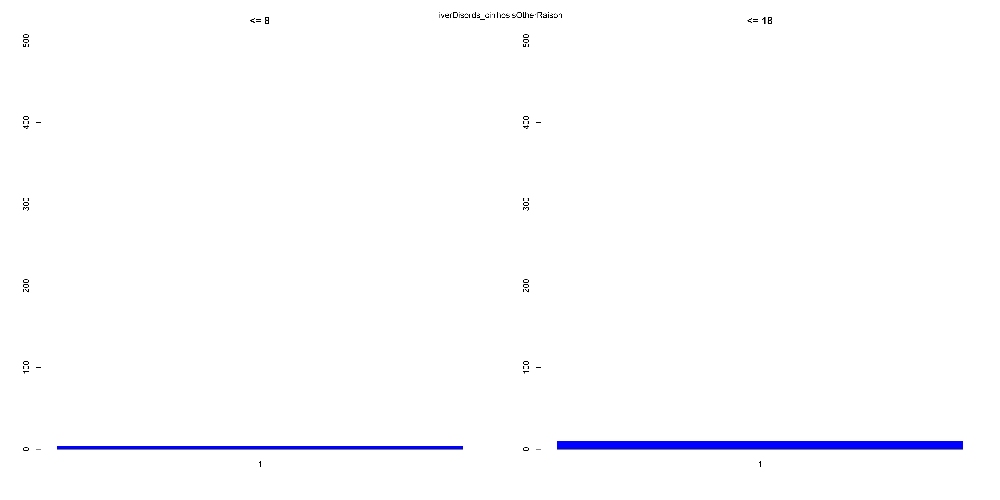

[1] "<= 8"

 1 
60 
[1] "<= 18"

  1 
157 


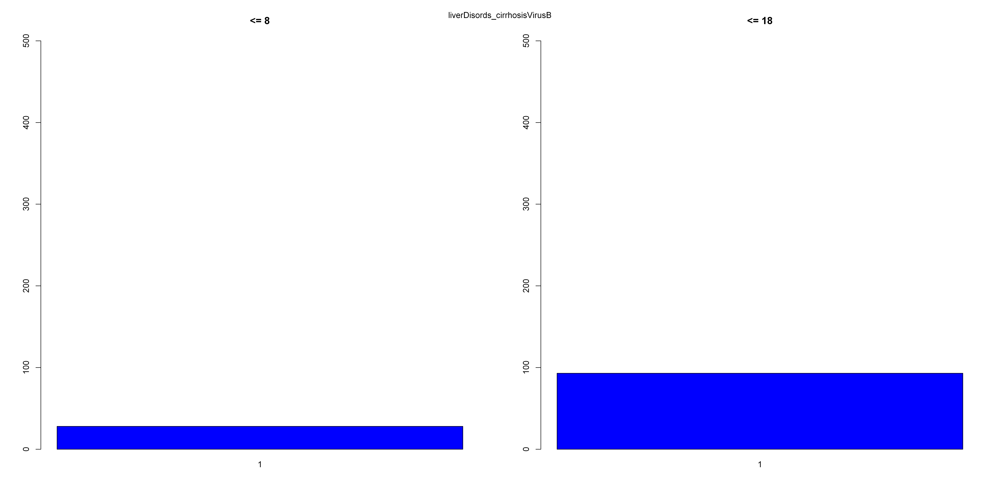

[1] "<= 8"

1 
6 
[1] "<= 18"

 1 
39 


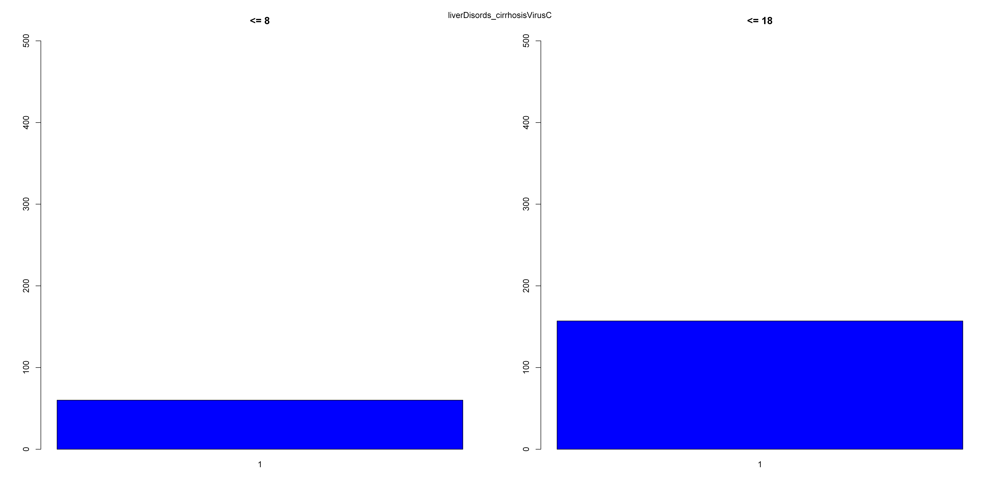

[1] "<= 8"

1 
0 
[1] "<= 18"

1 
1 


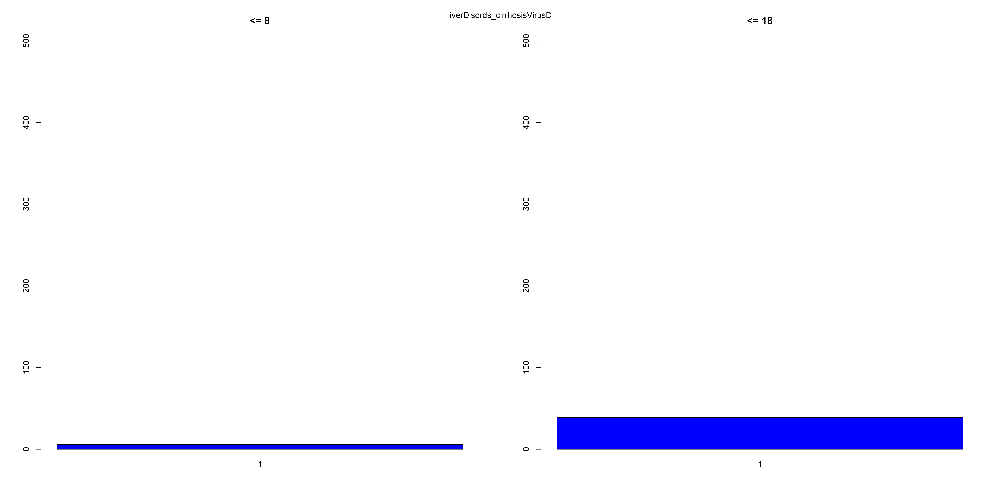

[1] "<= 8"

1 
1 
[1] "<= 18"

1 
1 


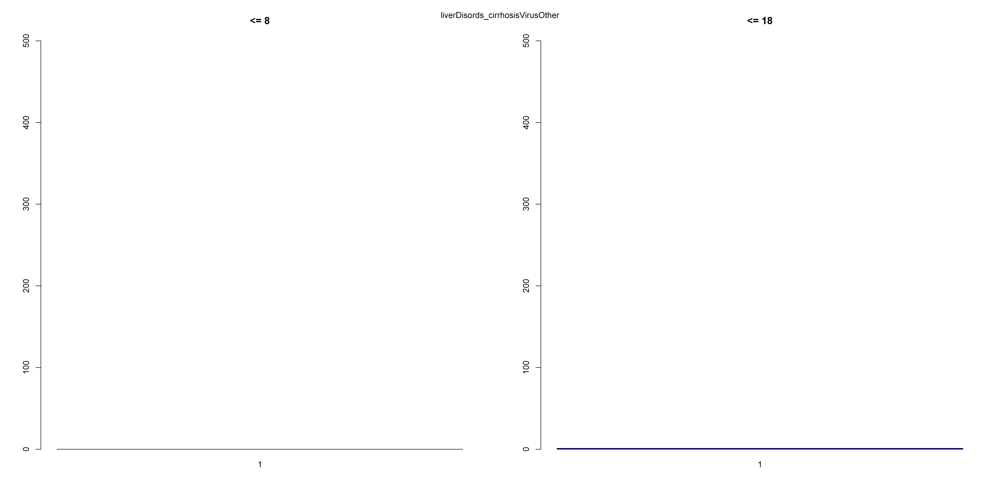

[1] "<= 8"

  1 
102 
[1] "<= 18"

  1 
238 


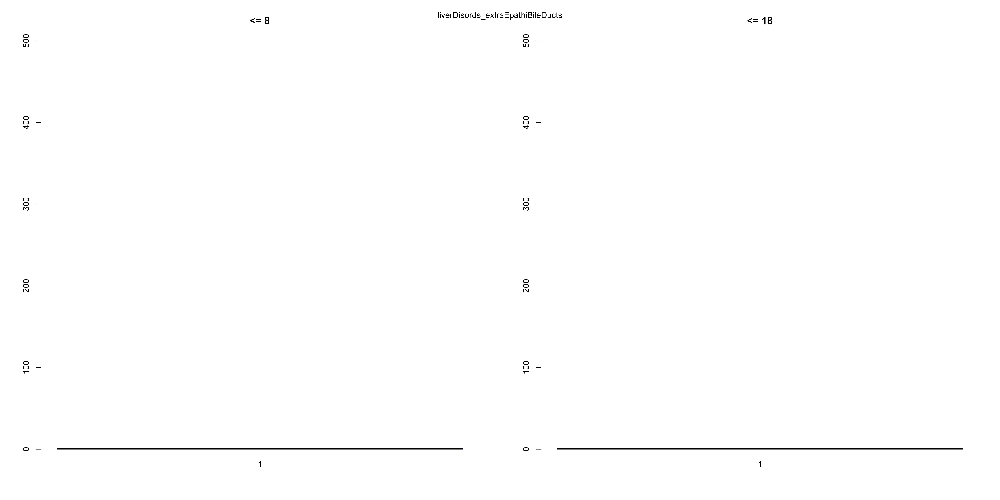

[1] "<= 8"

1 
6 
[1] "<= 18"

 1 
19 


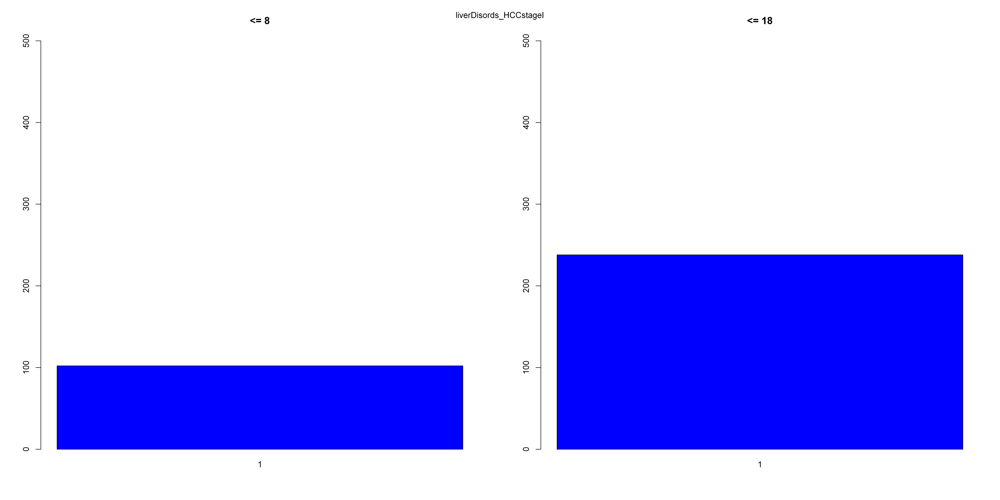

[1] "<= 8"

1 
1 
[1] "<= 18"

1 
2 


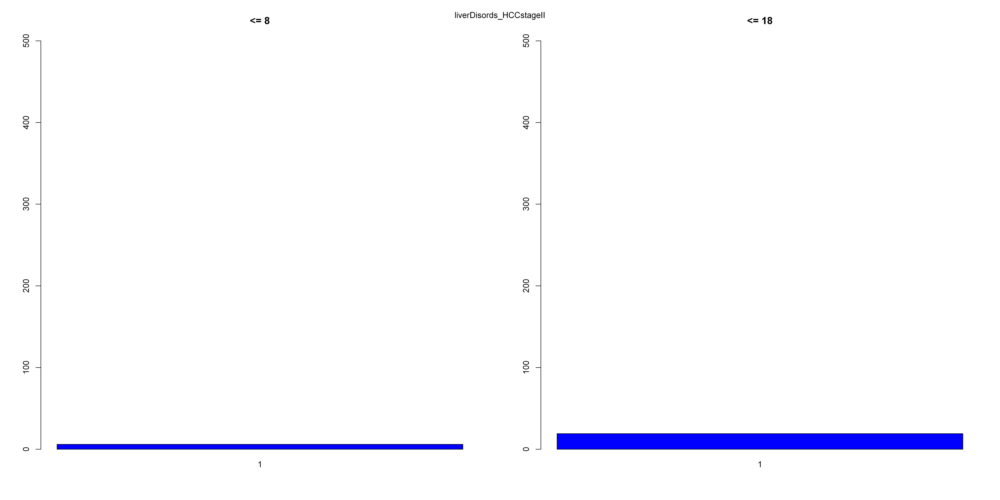

[1] "<= 8"

1 
0 
[1] "<= 18"

1 
7 


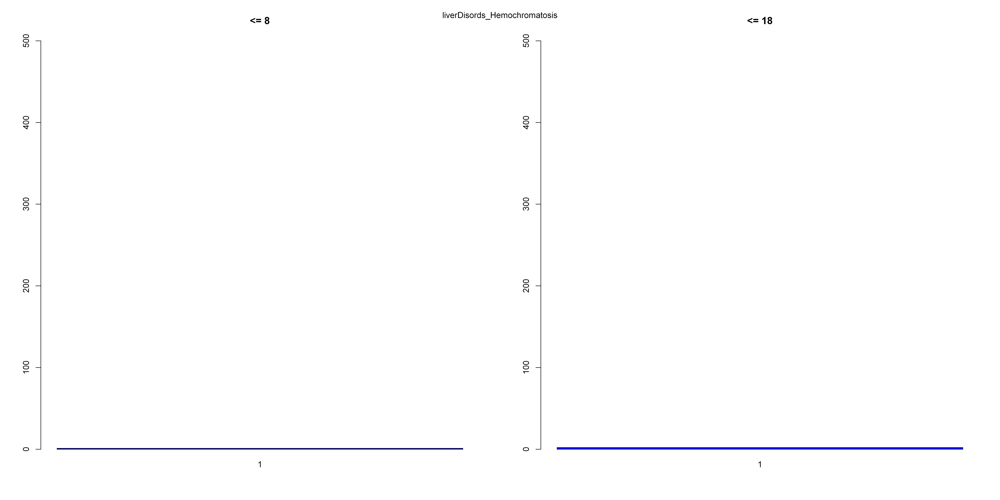

[1] "<= 8"

 1 
20 
[1] "<= 18"

 1 
69 


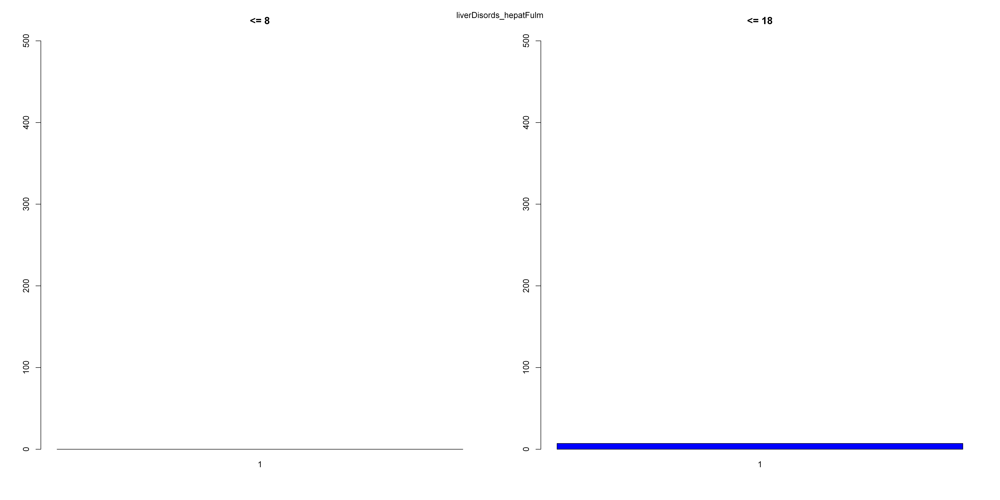

[1] "<= 8"

1 
2 
[1] "<= 18"

1 
8 


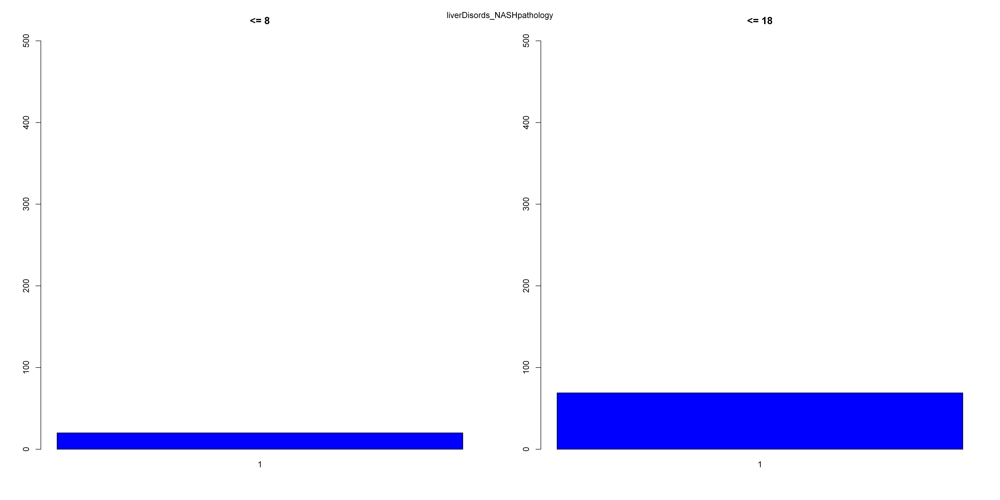

[1] "<= 8"

1 
0 
[1] "<= 18"

1 
4 


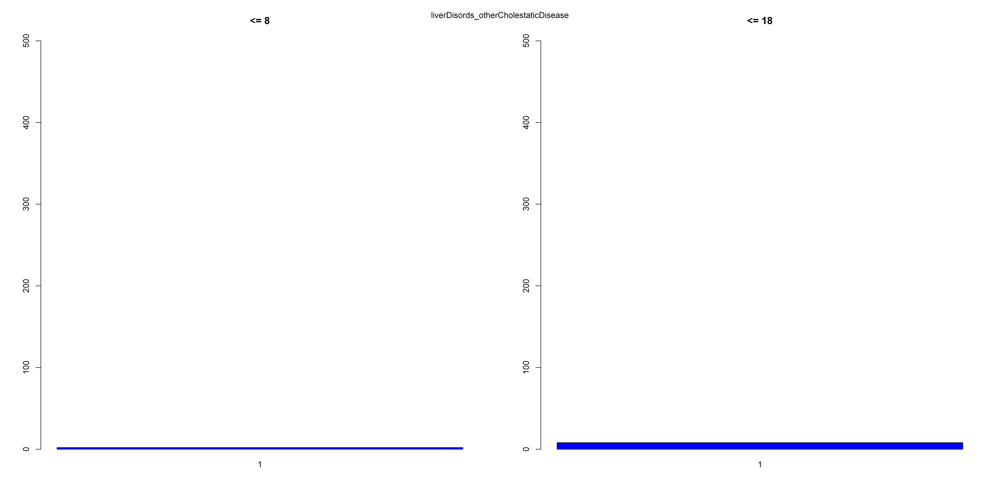

[1] "<= 8"

1 
4 
[1] "<= 18"

 1 
11 


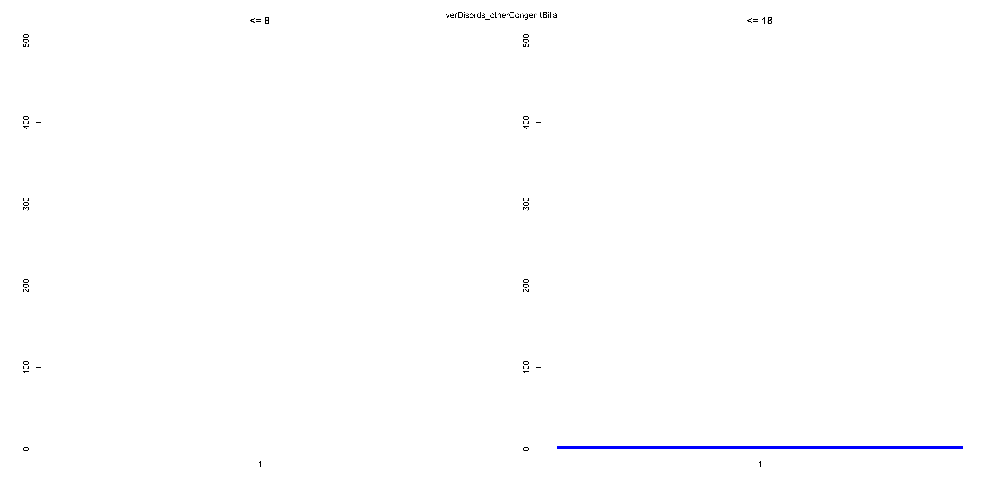

[1] "<= 8"

1 
2 
[1] "<= 18"

 1 
15 


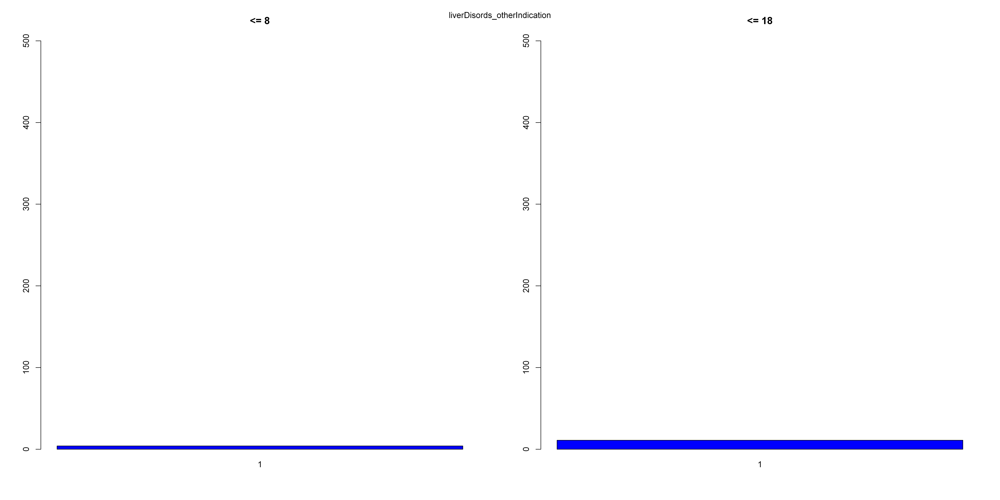

[1] "<= 8"

1 
5 
[1] "<= 18"

 1 
25 


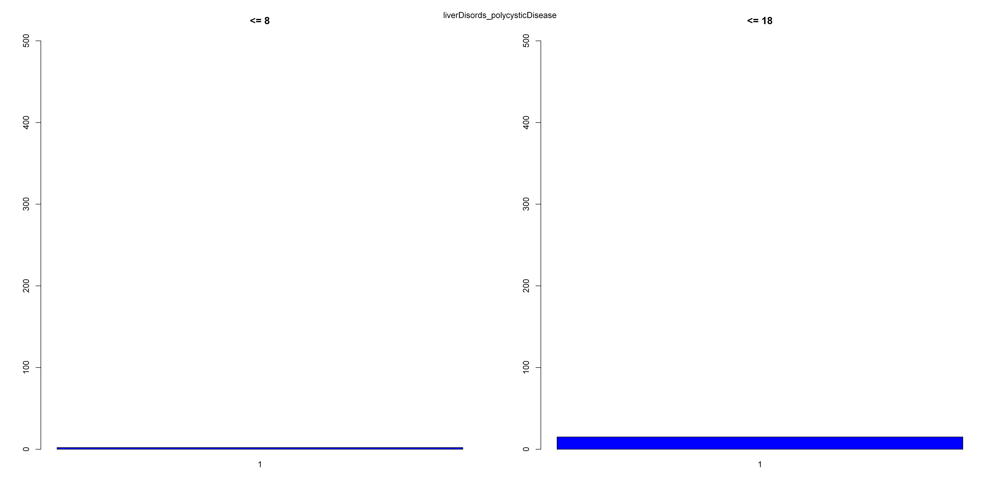

[1] "<= 8"

1 
2 
[1] "<= 18"

 1 
11 


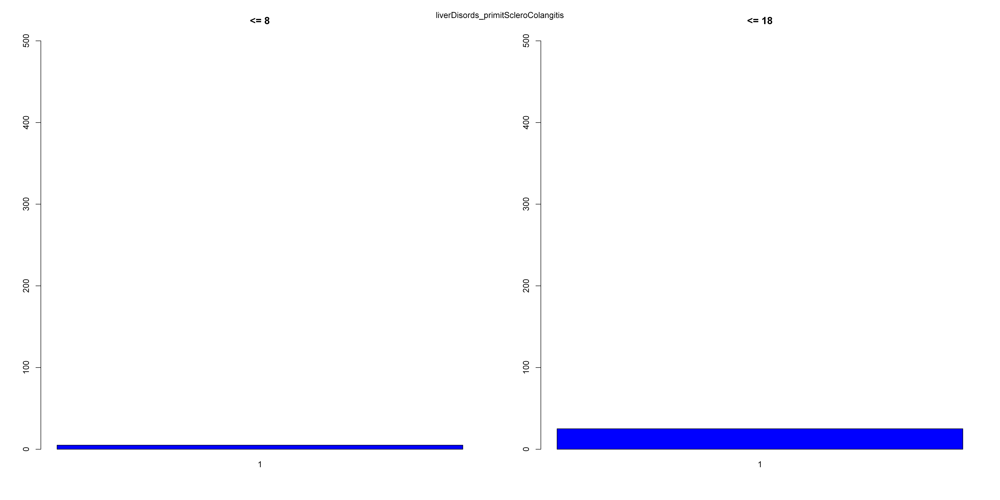

[1] "<= 8"

1 
0 
[1] "<= 18"

1 
5 


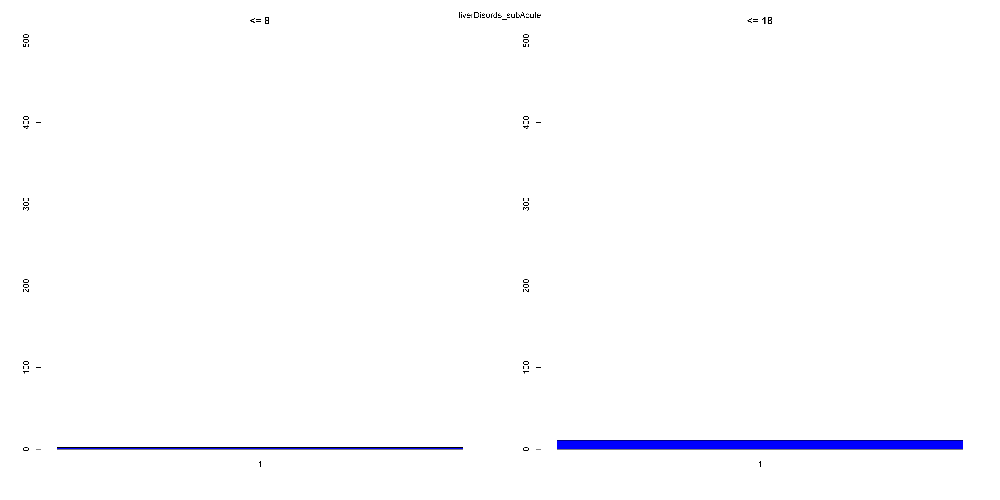

[1] "<= 8"

1 2 
7 0 
[1] "<= 18"

 1  2 
13  1 


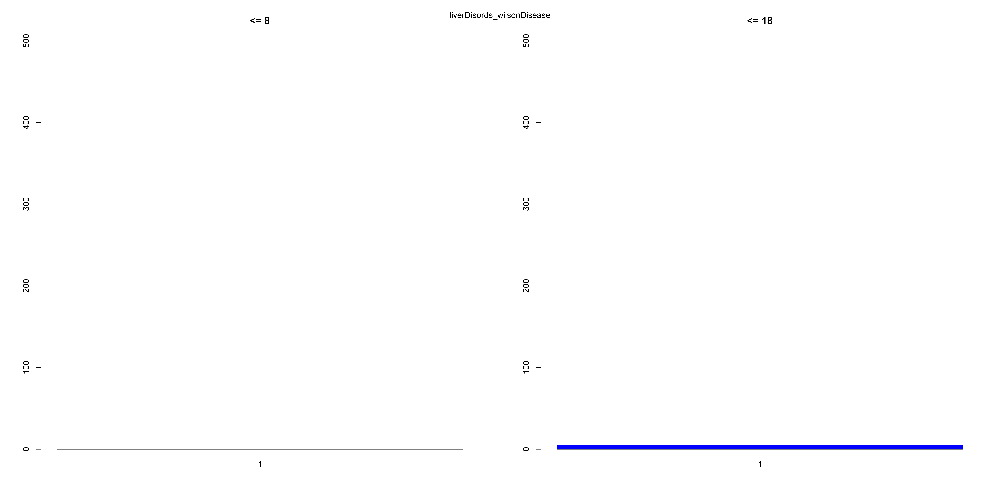

[1] "<= 8"

 responsNo responsYes 
         1          0 
[1] "<= 18"

 responsNo responsYes 
         9          7 


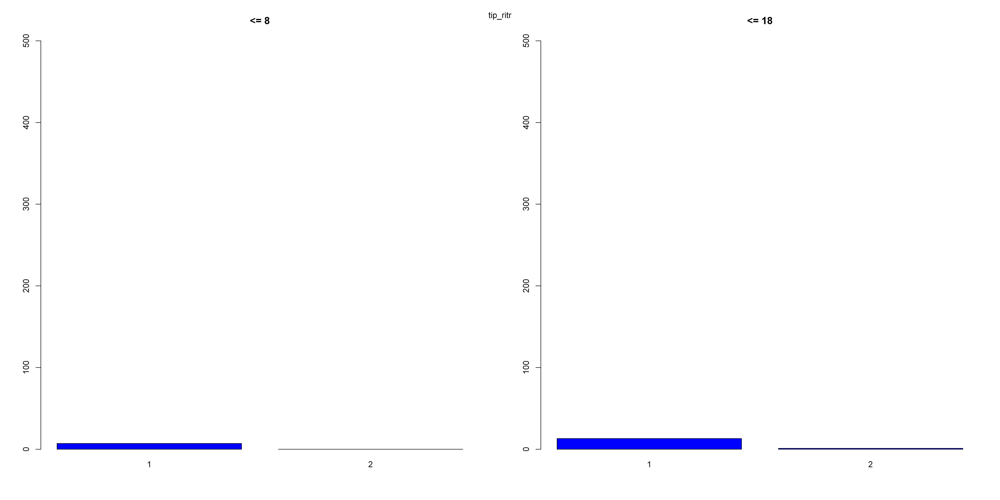

[1] "<= 8"

  Episodic  Appellant Persistent 
        12          9          1 
[1] "<= 18"

  Episodic  Appellant Persistent 
        91         29          7 


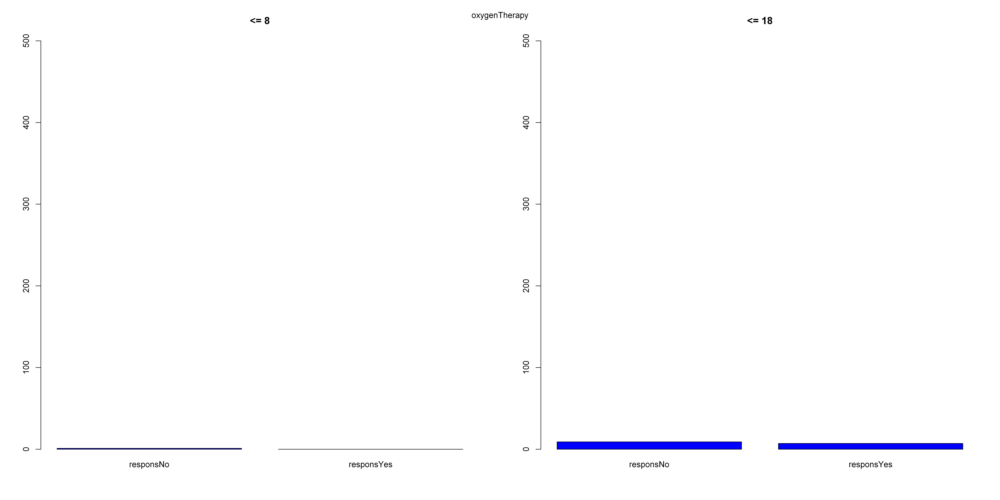

[1] "<= 8"

  degreeI  degreeII degreeIII  degreeIV 
        7        12         3         0 
[1] "<= 18"

  degreeI  degreeII degreeIII  degreeIV 
       49        61        11         6 


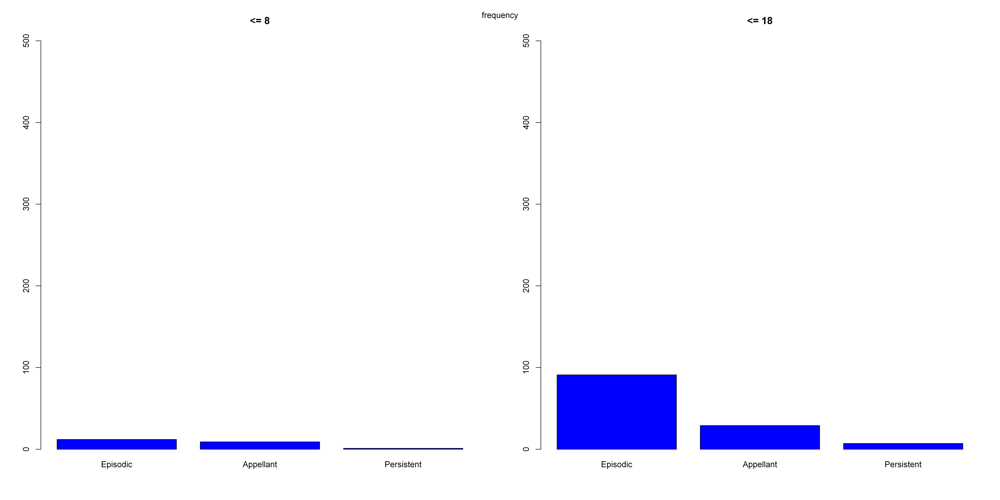

[1] "<= 8"

  classI  classII classIII  classIV   classV 
       2        3       15        2        1 
[1] "<= 18"

  classI  classII classIII  classIV   classV 
       0        8       40        1        0 


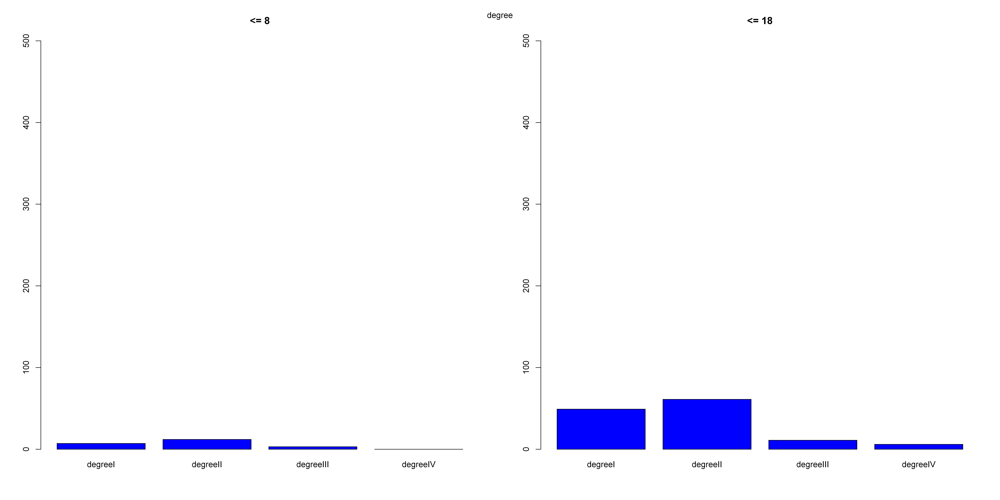

[1] "<= 8"

under30  30to60   sup60 
    100       5       1 
[1] "<= 18"

under30  30to60   sup60 
    360      19       0 


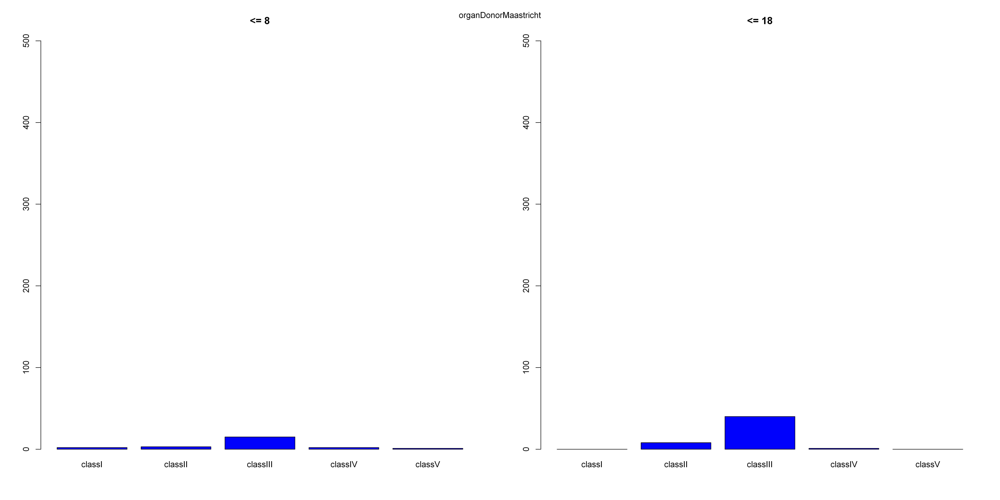

[1] "<= 8"

   Oxygenated NotOxygenated 
           52             1 
[1] "<= 18"

   Oxygenated NotOxygenated 
          122             8 


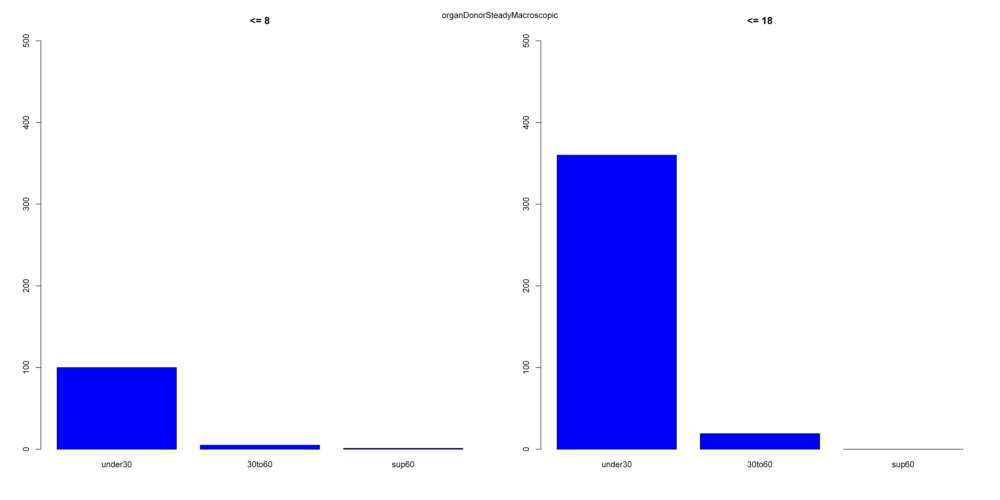

[1] "<= 8"

  1   0 
 15 141 
[1] "<= 18"

  1   0 
 45 515 


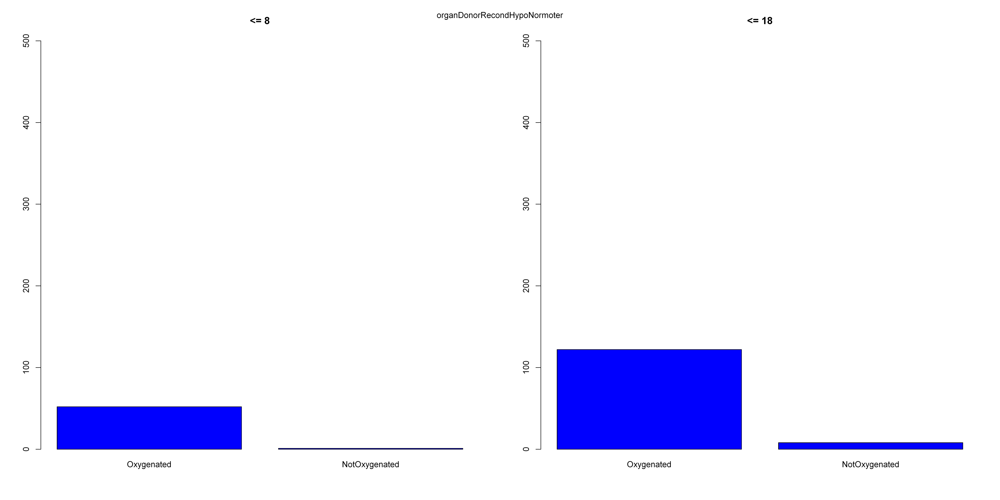

[1] "<= 8"

  1   0 
  1 155 
[1] "<= 18"

  1   0 
  5 555 


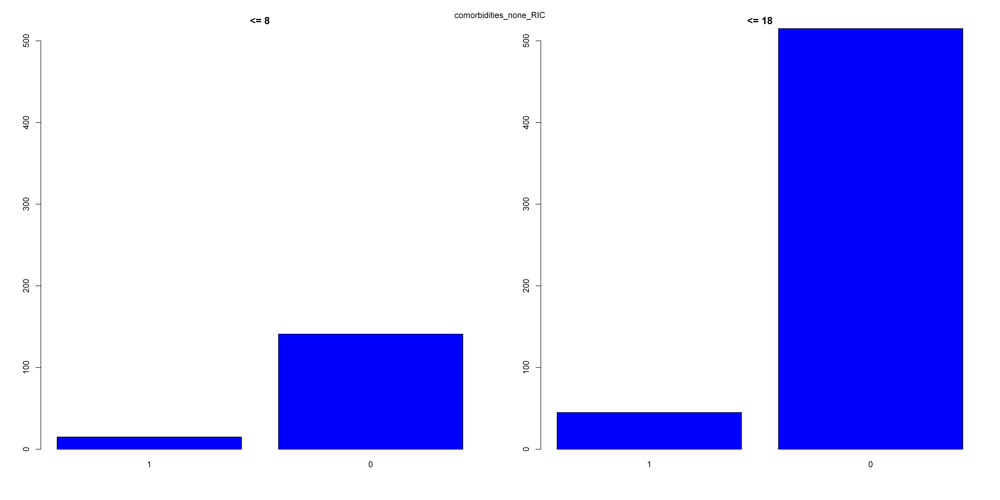

[1] "<= 8"

  1   0 
 13 143 
[1] "<= 18"

  1   0 
 39 521 


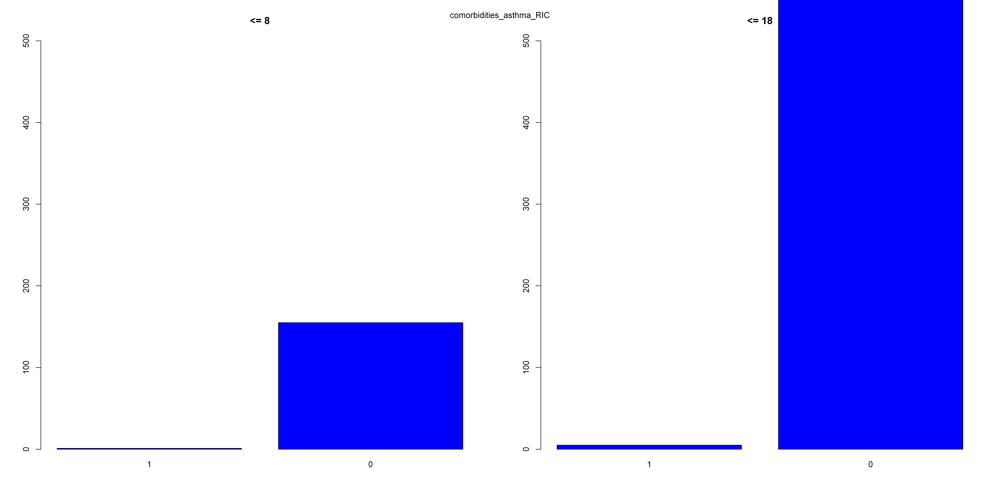

[1] "<= 8"

  1   0 
  0 156 
[1] "<= 18"

  1   0 
  3 557 


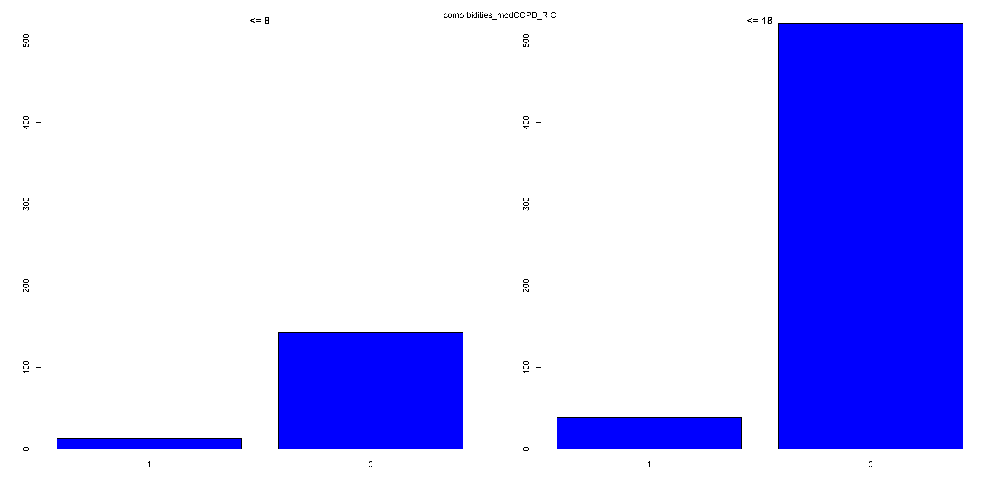

[1] "<= 8"

  1   0 
  4 152 
[1] "<= 18"

  1   0 
 13 547 


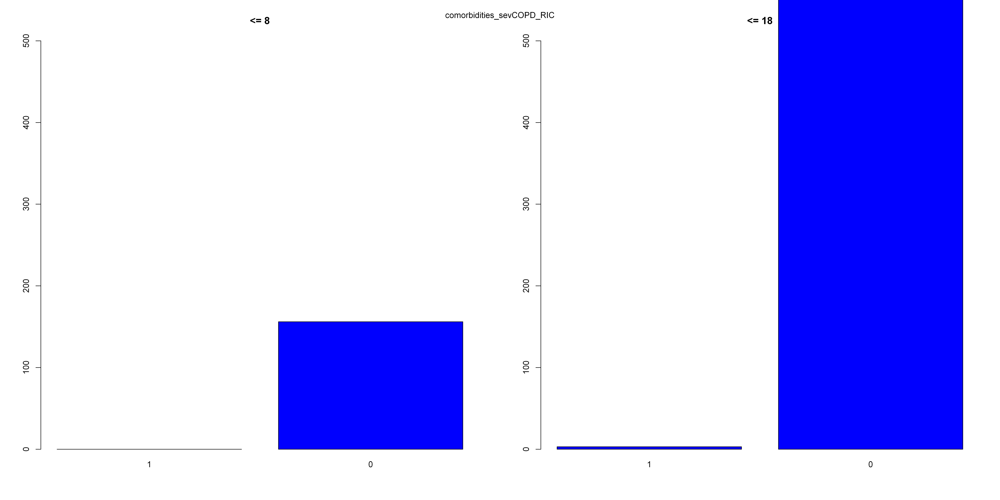

[1] "<= 8"

  1   0 
 48 108 
[1] "<= 18"

  1   0 
177 383 


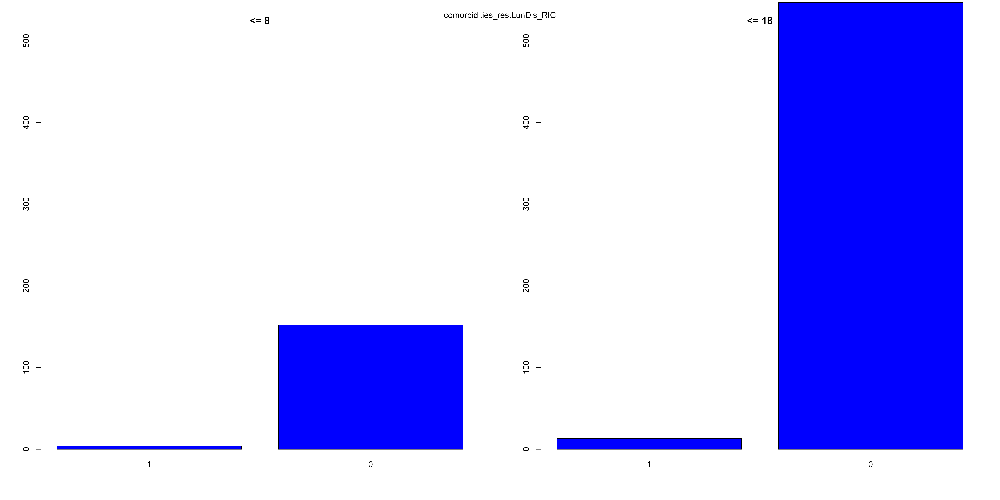

[1] "<= 8"

  1   0 
  0 156 
[1] "<= 18"

  1   0 
  0 560 


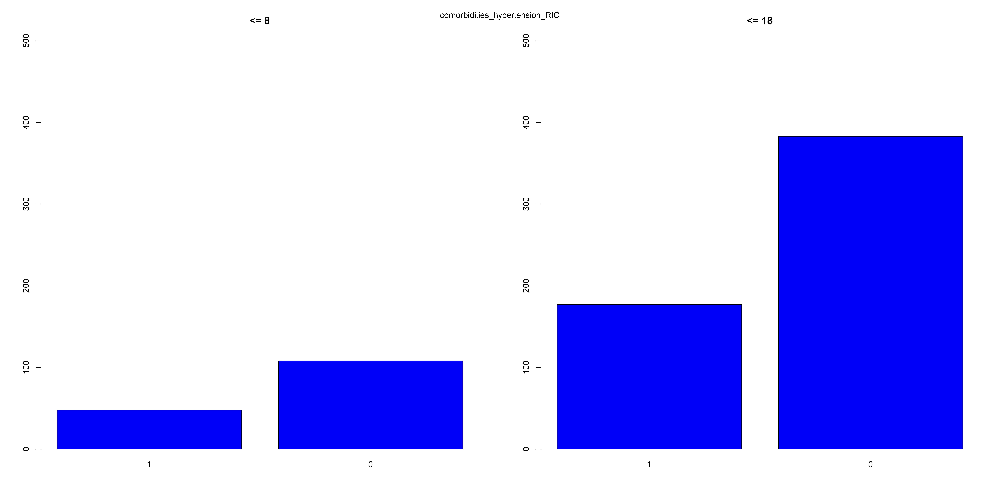

[1] "<= 8"

  1   0 
  3 153 
[1] "<= 18"

  1   0 
  5 555 


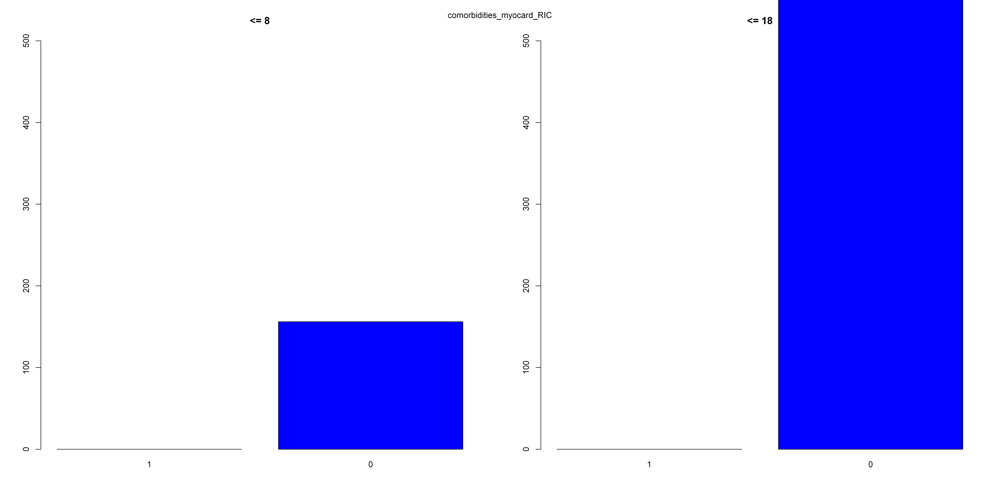

[1] "<= 8"

  1   0 
  0 156 
[1] "<= 18"

  1   0 
  0 560 


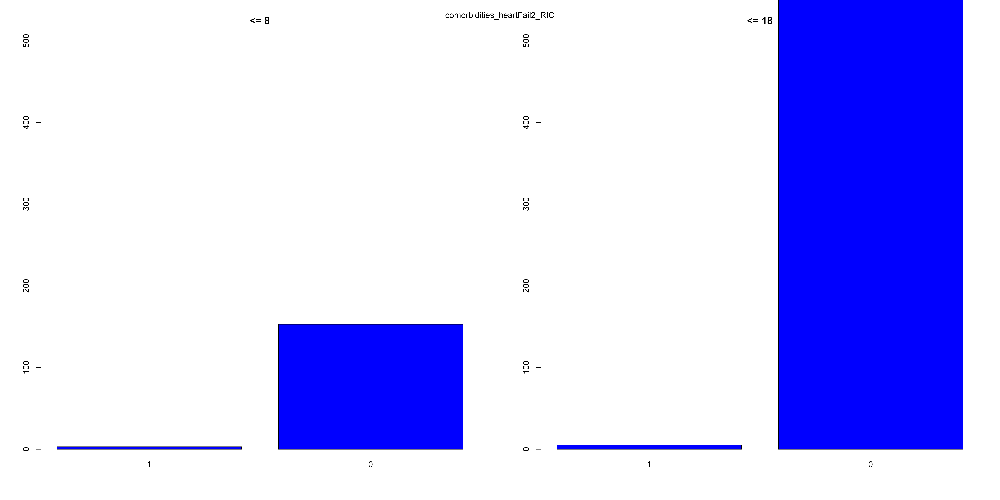

[1] "<= 8"

  1   0 
  5 151 
[1] "<= 18"

  1   0 
 15 545 


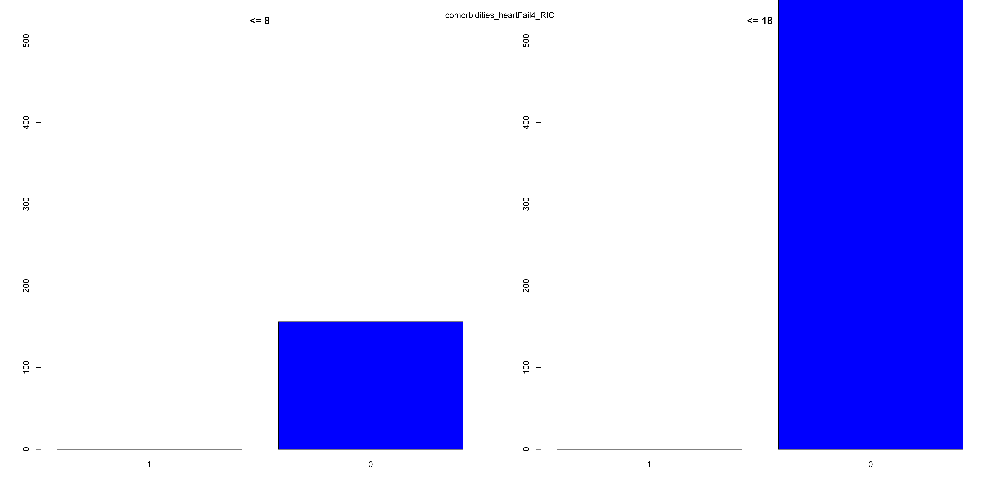

[1] "<= 8"

  1   0 
  8 148 
[1] "<= 18"

  1   0 
 13 547 


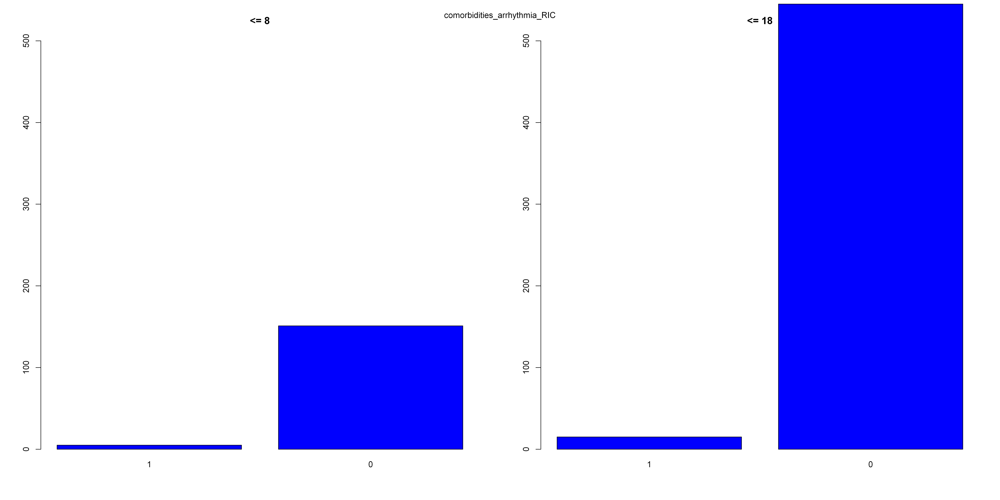

[1] "<= 8"

  1   0 
  0 156 
[1] "<= 18"

  1   0 
  0 560 


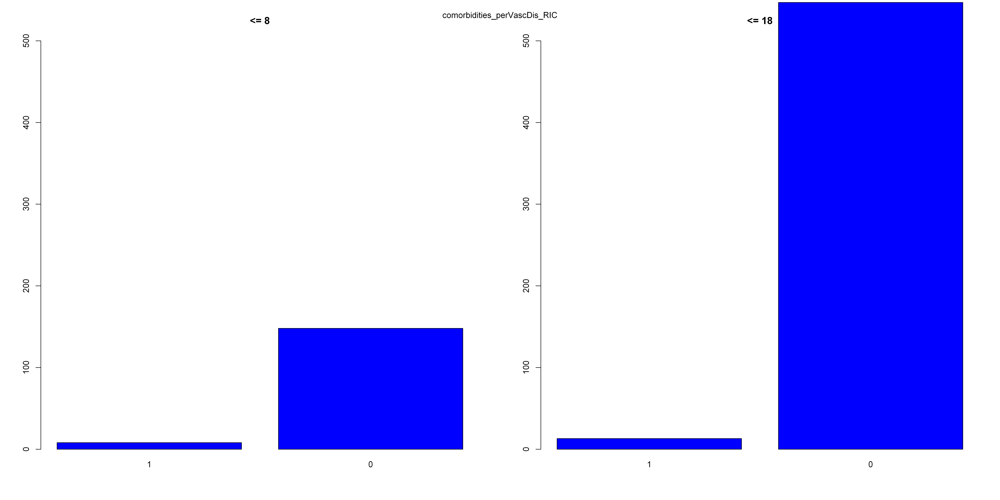

[1] "<= 8"

  1   0 
  3 153 
[1] "<= 18"

  1   0 
  5 555 


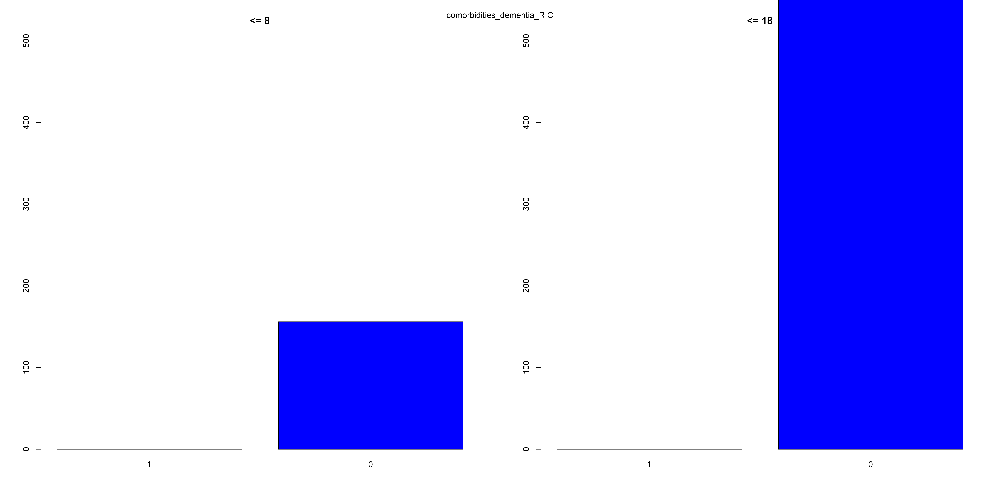

[1] "<= 8"

  1   0 
  0 156 
[1] "<= 18"

  1   0 
  1 559 


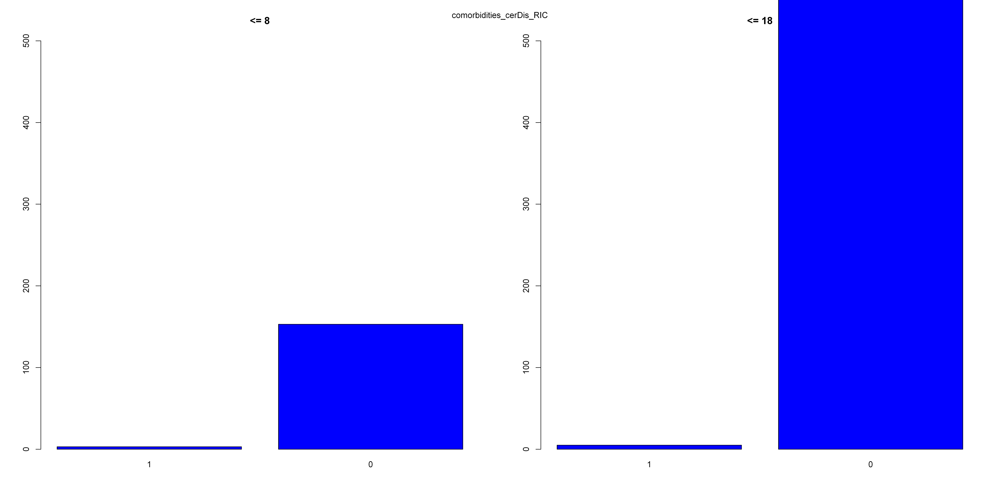

[1] "<= 8"

  1   0 
  1 155 
[1] "<= 18"

  1   0 
  4 556 


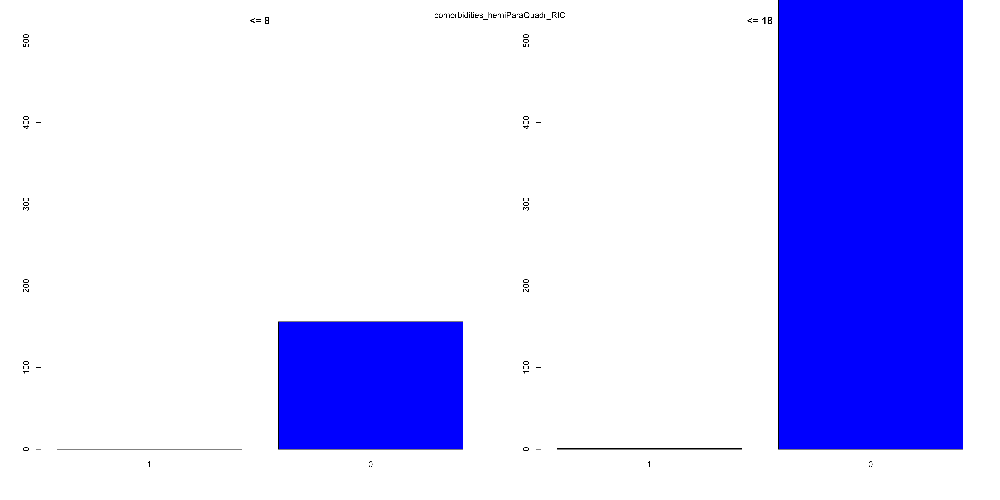

[1] "<= 8"

  1   0 
  1 155 
[1] "<= 18"

  1   0 
 19 541 


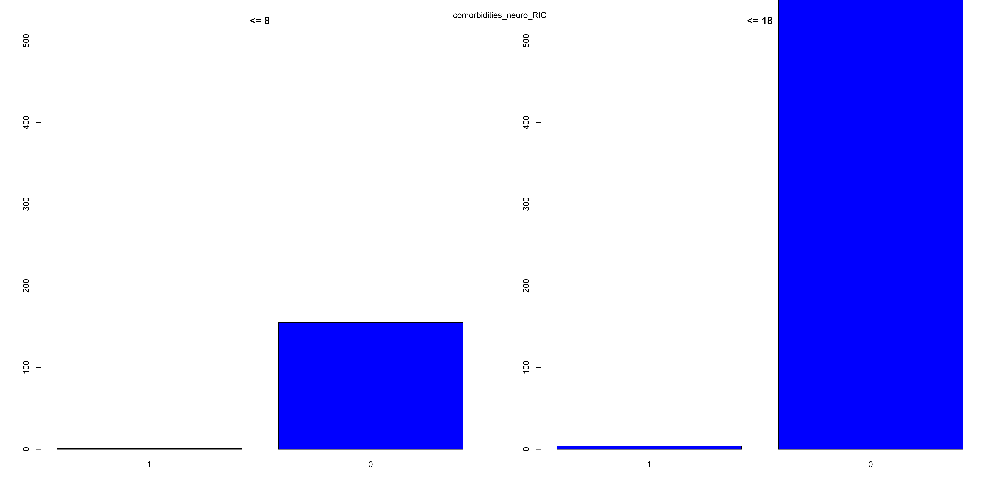

[1] "<= 8"

  1   0 
  0 156 
[1] "<= 18"

  1   0 
  2 558 


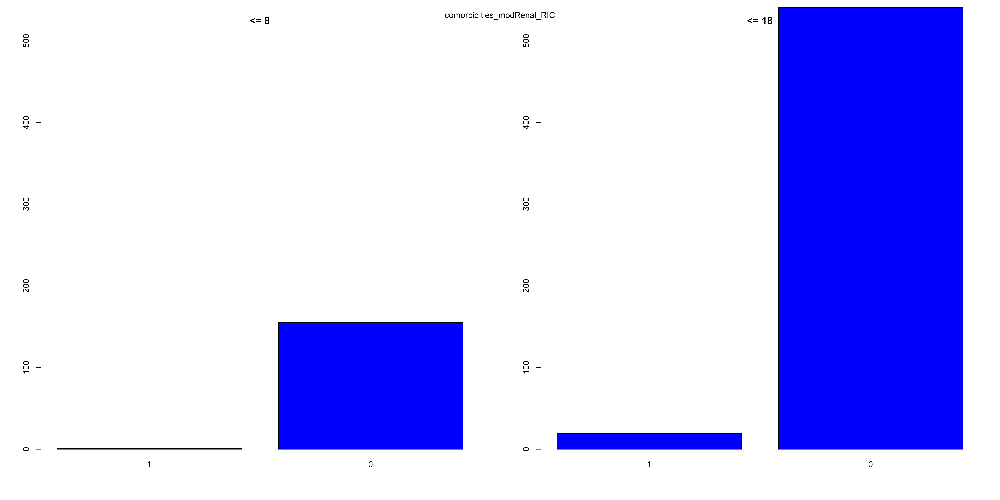

[1] "<= 8"

  1   0 
 11 145 
[1] "<= 18"

  1   0 
 47 513 


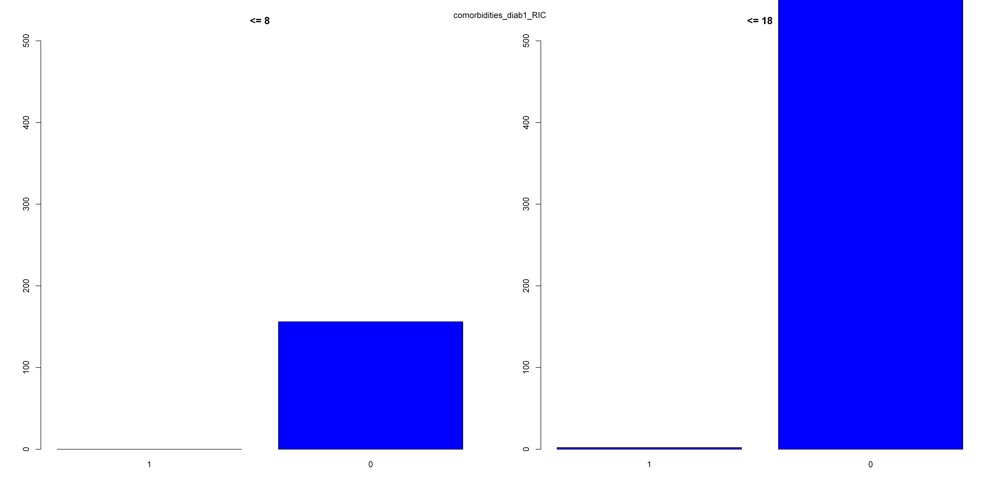

[1] "<= 8"

  1   0 
 15 141 
[1] "<= 18"

  1   0 
 65 495 


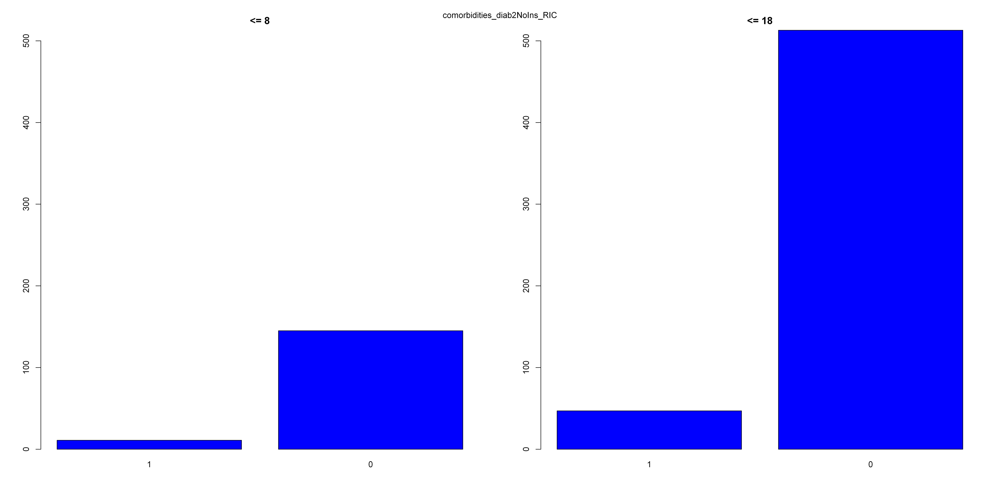

[1] "<= 8"

  1   0 
  9 147 
[1] "<= 18"

  1   0 
 23 537 


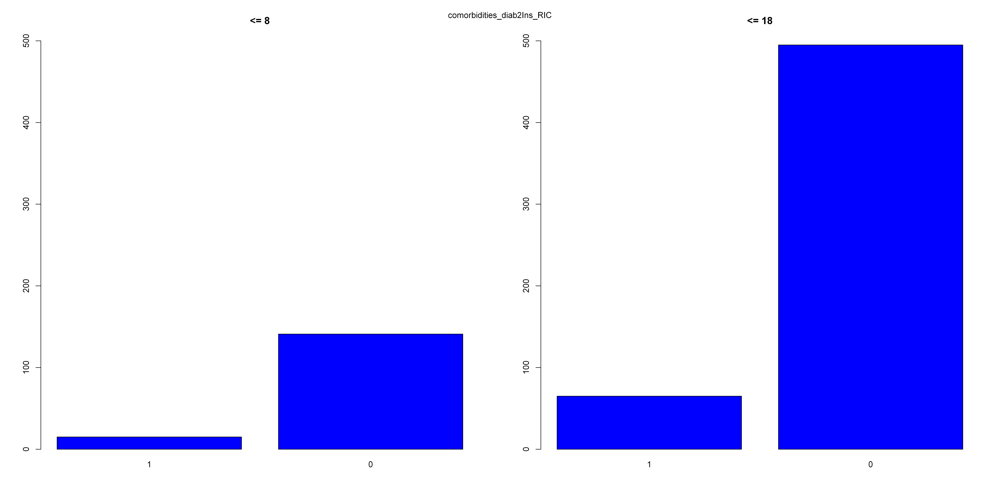

[1] "<= 8"

  1   0 
  7 149 
[1] "<= 18"

  1   0 
 18 542 


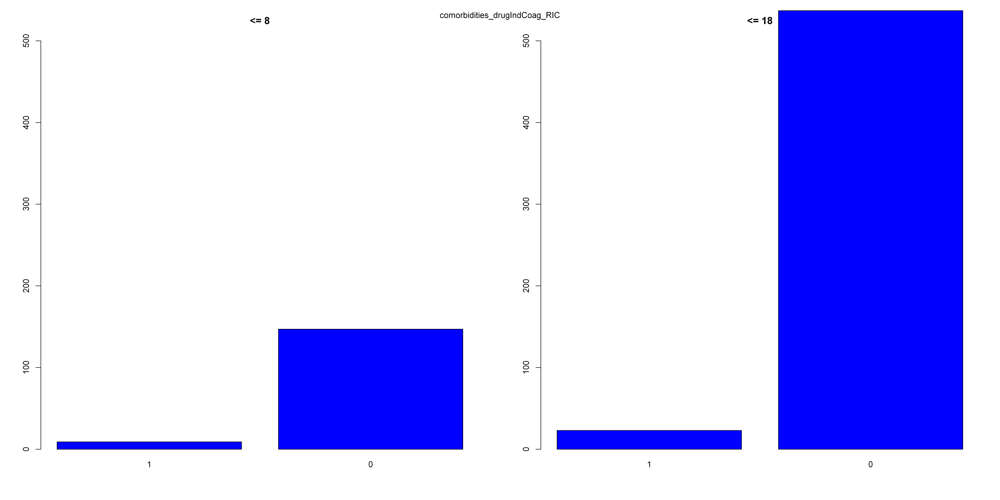

[1] "<= 8"

  1   0 
  0 156 
[1] "<= 18"

  1   0 
  9 551 


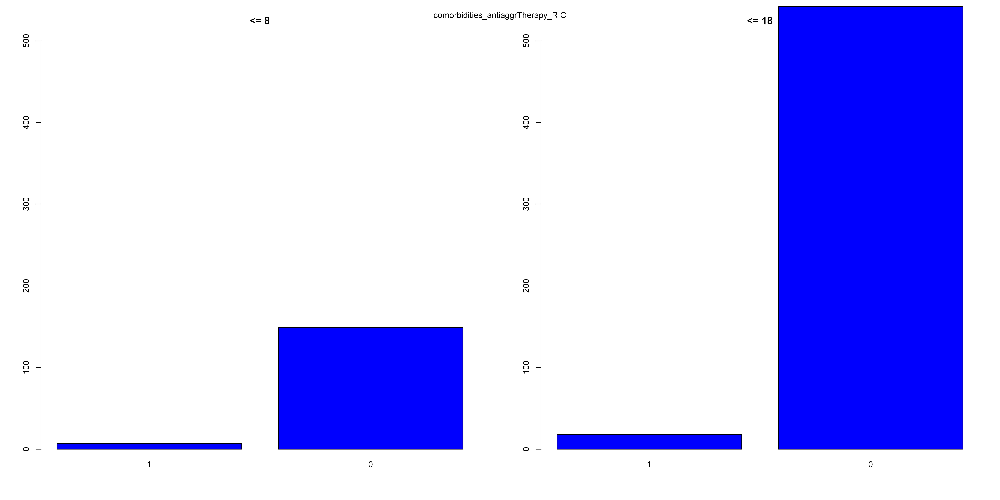

[1] "<= 8"

IT003 IT126 IT236 IT271 IT456 IT630 IT681 
    2    80     0     3    53     8    11 
[1] "<= 18"

IT003 IT126 IT236 IT271 IT456 IT630 IT681 
   25   162    12     3    73   146   139 


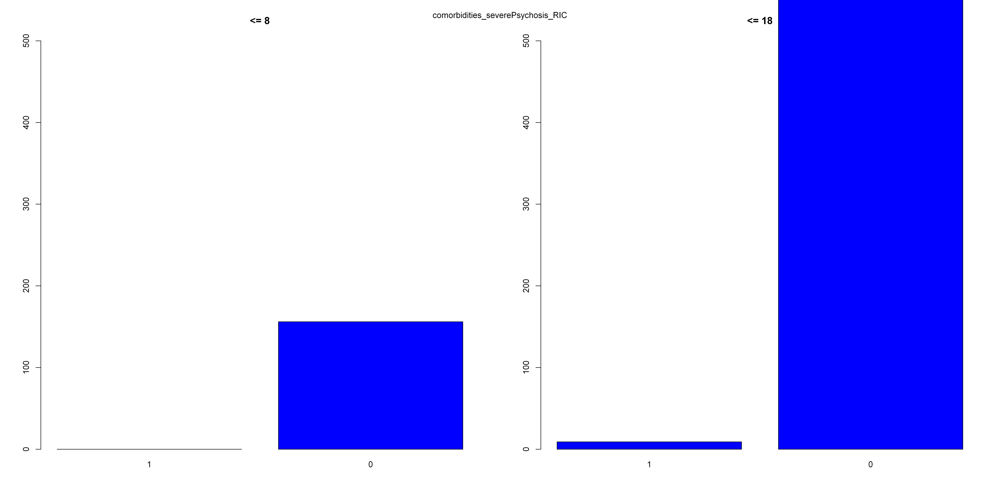

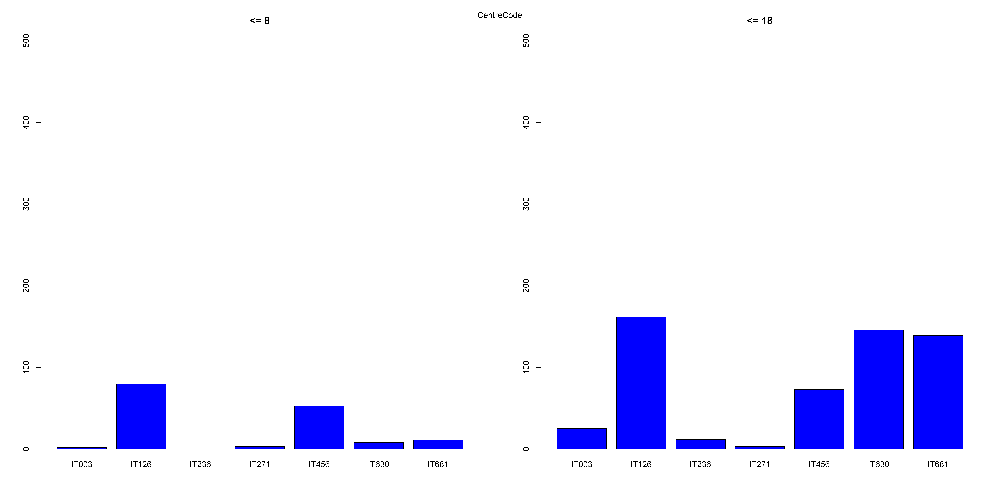

In [34]:
descrittiva_discrete(df_discrete1,df_discrete2)

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   21.0    53.0    59.0    56.9    64.0    75.0 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  14.00   52.75   58.00   56.42   64.00   75.00 
[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.000   0.000   1.000   1.929   1.000  61.000       1 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   3.714   1.000  97.000 


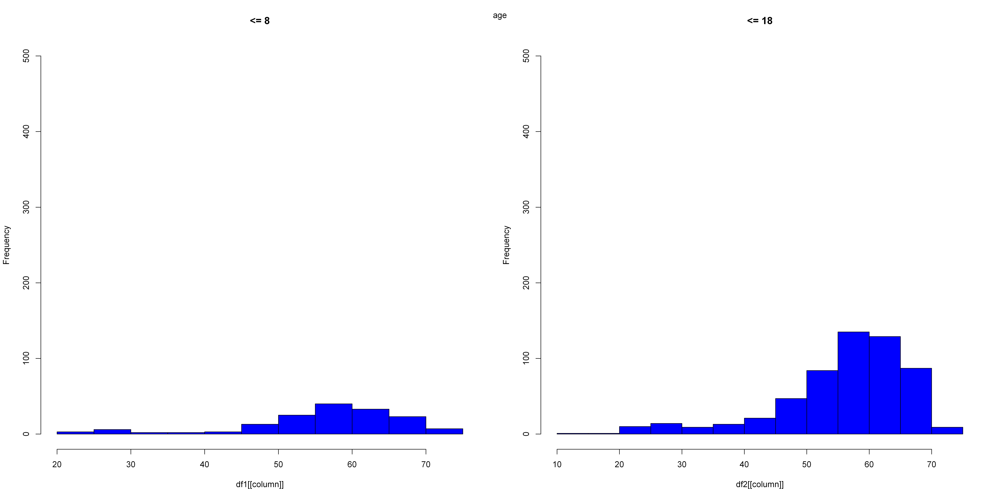

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.300   0.710   1.100   2.658   2.100  43.740 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.240   0.970   1.995   4.682   4.625  48.500 


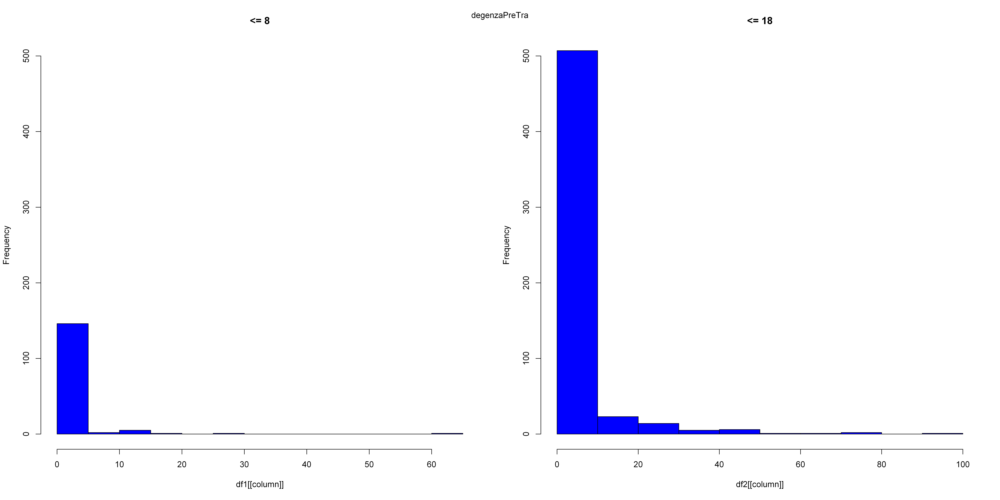

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.900   1.100   1.220   1.342   1.420   3.080 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.800   1.188   1.370   1.561   1.690   6.600 


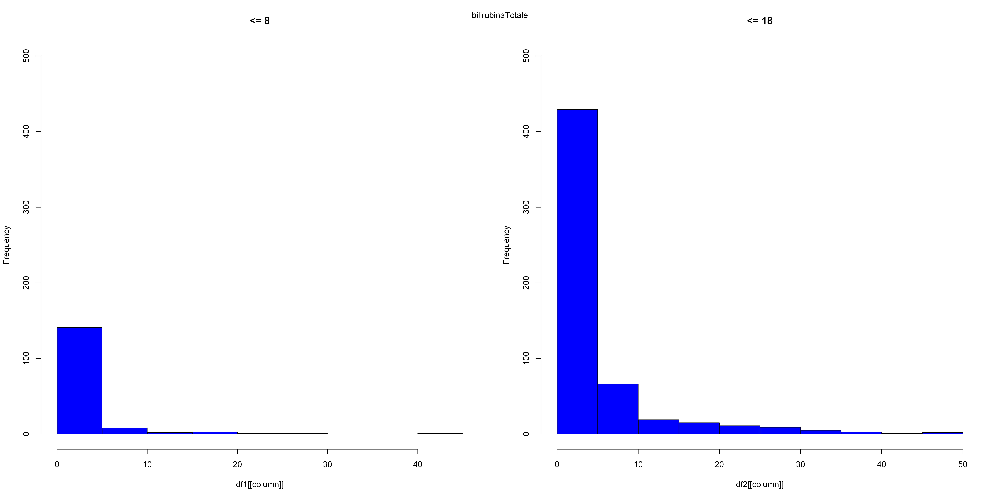

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.4300  0.7000  0.8200  0.9445  0.9500 10.7200 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.230   0.700   0.850   0.965   1.050   4.000 


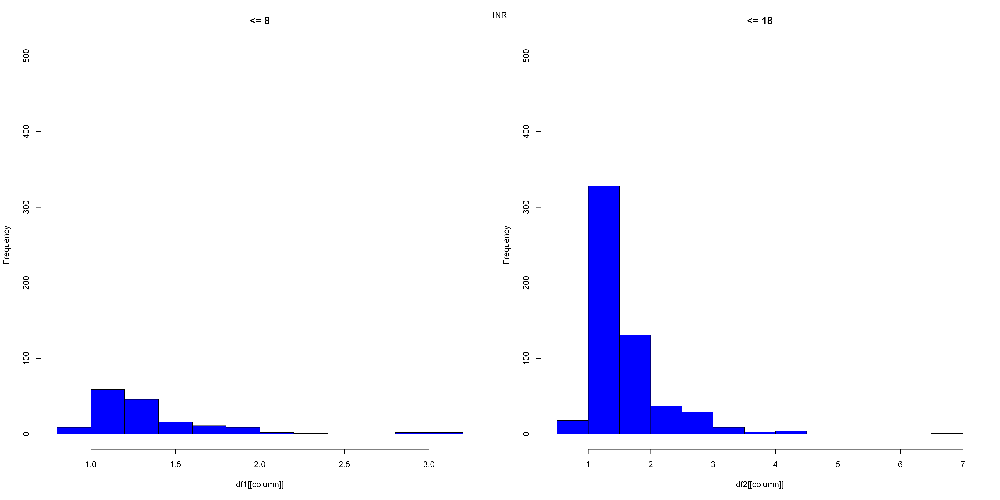

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  120.0   137.0   139.0   138.7   141.0   148.0 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  122.0   136.0   138.0   137.8   140.2   154.0 


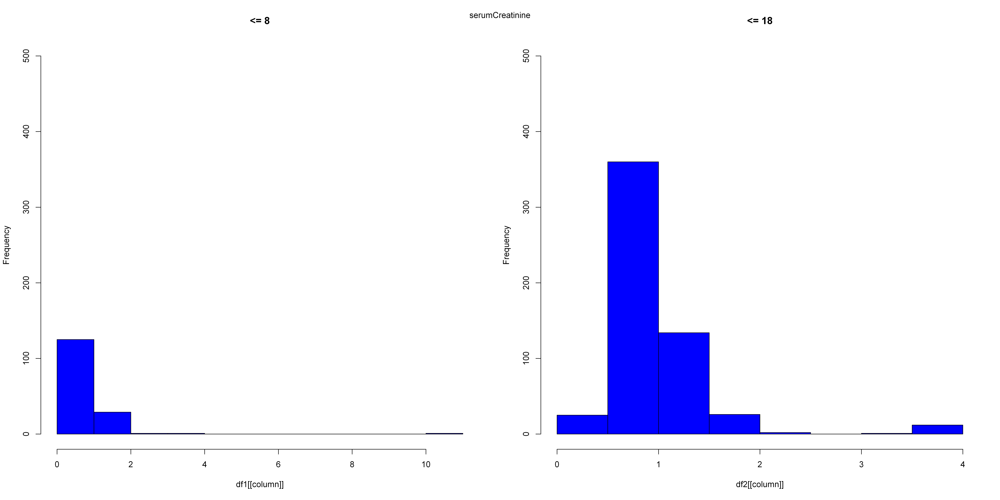

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  120.0   361.0   419.0   404.6   476.0   500.0 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  100.0   300.0   400.0   373.9   440.5   500.0 


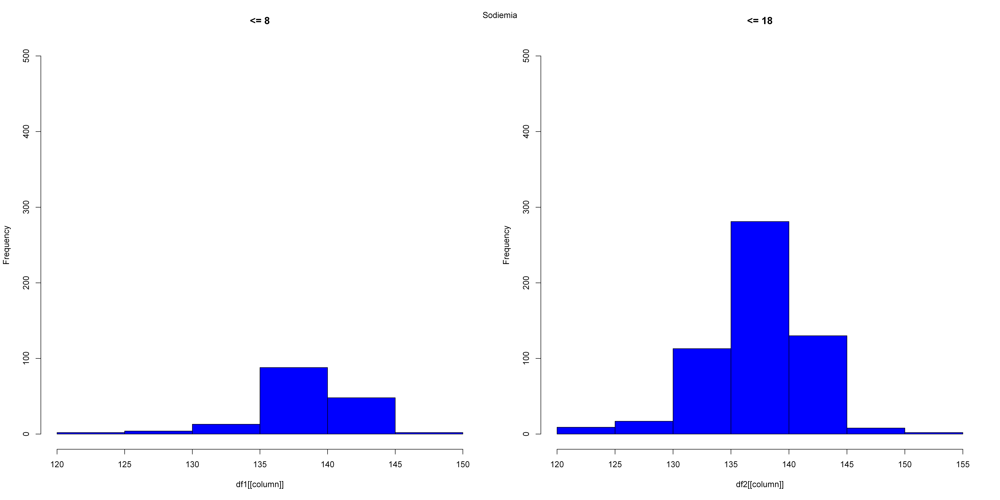

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
     19      62      94     130     168     800 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    7.0    55.0    85.5   110.5   132.2   595.0 


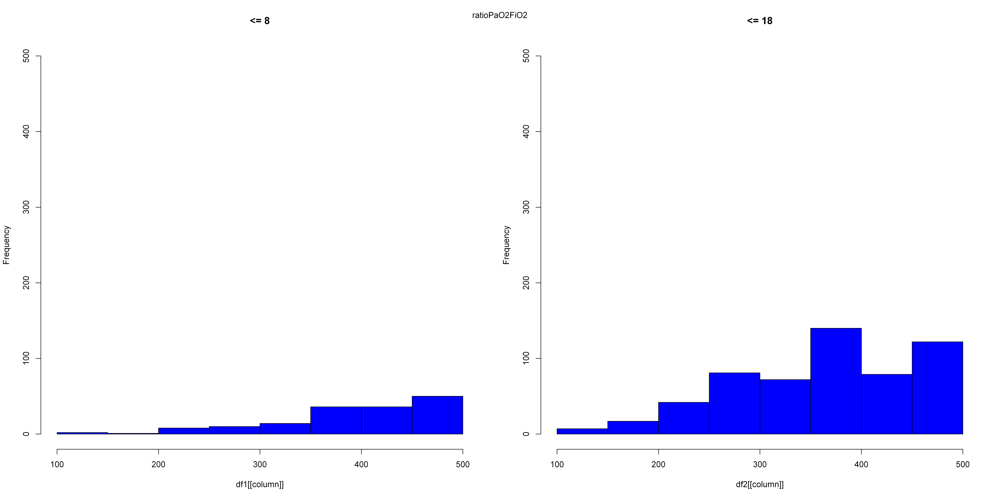

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  2.050   3.300   3.700   3.728   4.100   5.000 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.900   3.000   3.500   3.532   4.000   5.000 


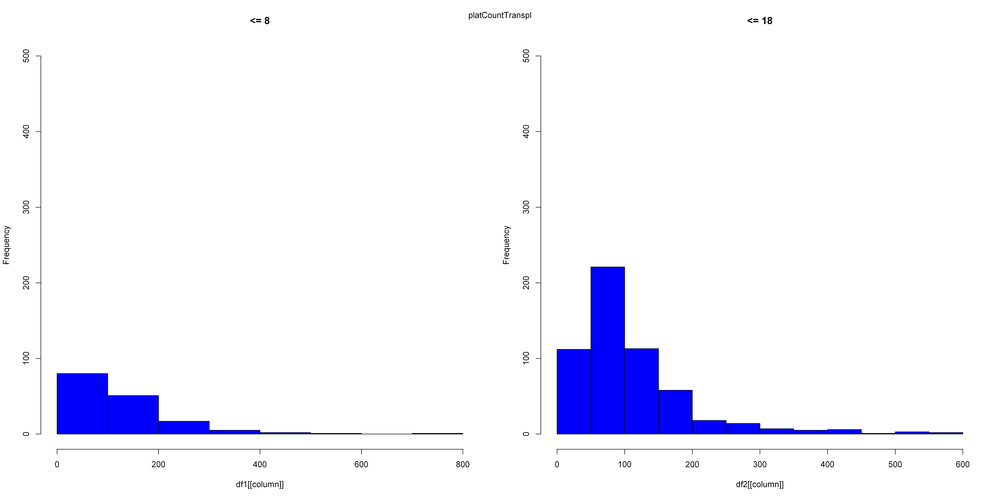

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  224.0   318.0   370.0   407.3   470.0   940.0 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  180.0   360.0   420.0   439.2   500.0  1440.0 


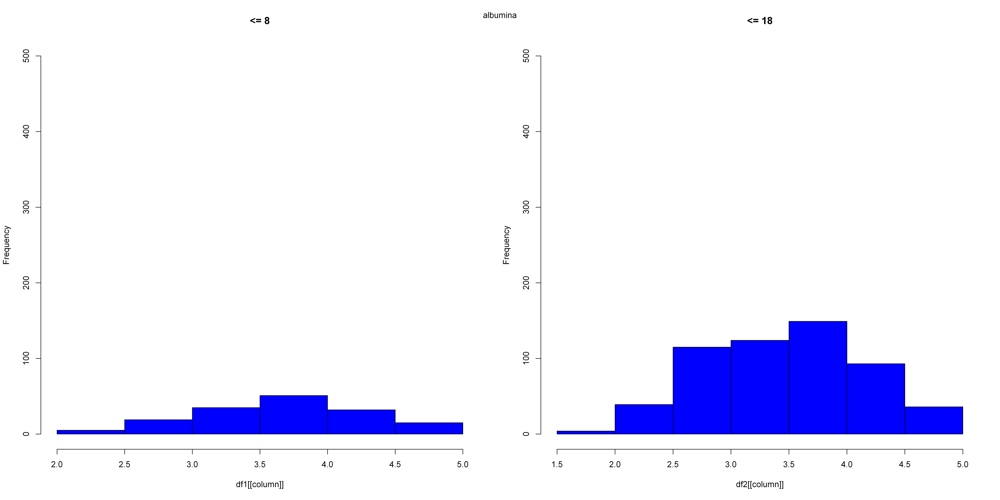

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   3.452   4.000 117.000 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00    0.00    3.00    3.87    5.00   44.00 


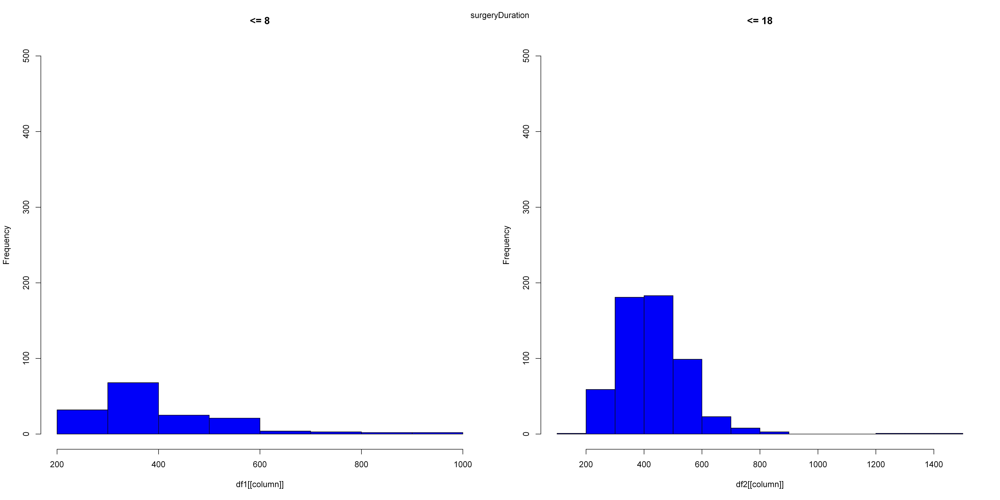

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    0.0     0.0     0.0   737.3  1000.0 30000.0 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    0.0     0.0     0.5   666.0  1000.0 10500.0 


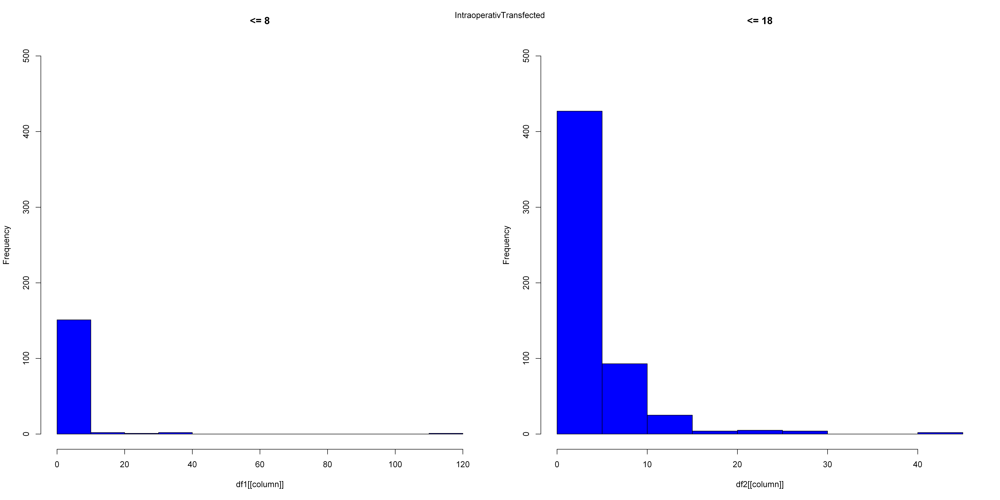

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00    0.00    0.00   97.13    0.00 2700.00 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0       0       0     144     350    1520       2 


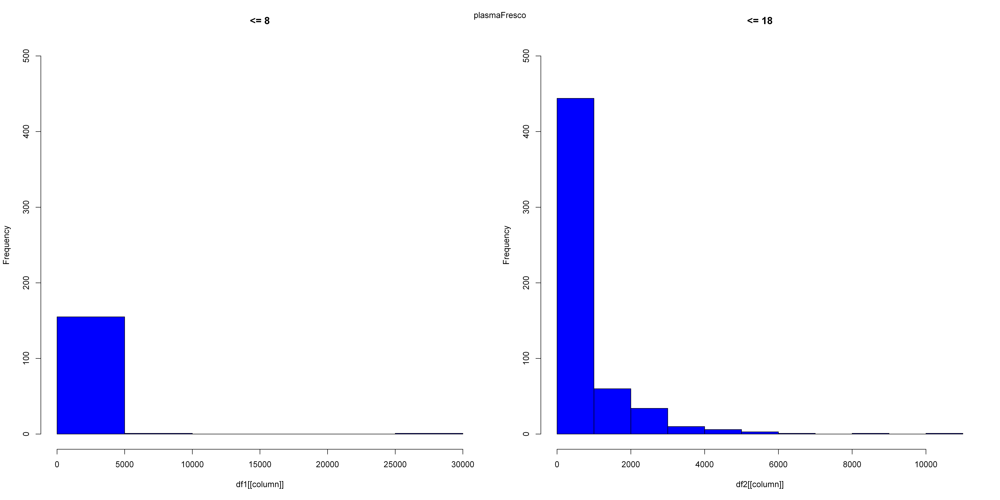

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.5096  0.0000  8.0000 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.5054  0.0000 10.0000 


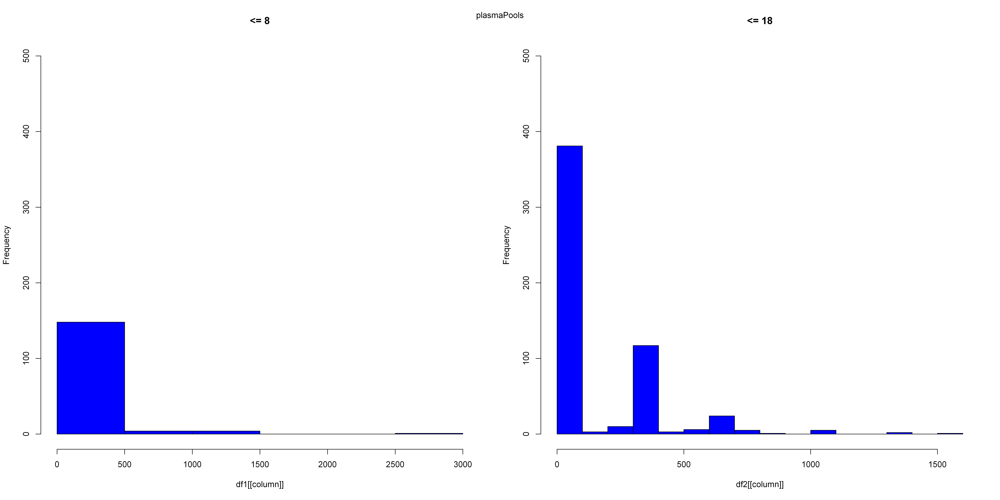

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   0.000   0.586   0.000  20.000 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.4554  0.0000 18.0000 


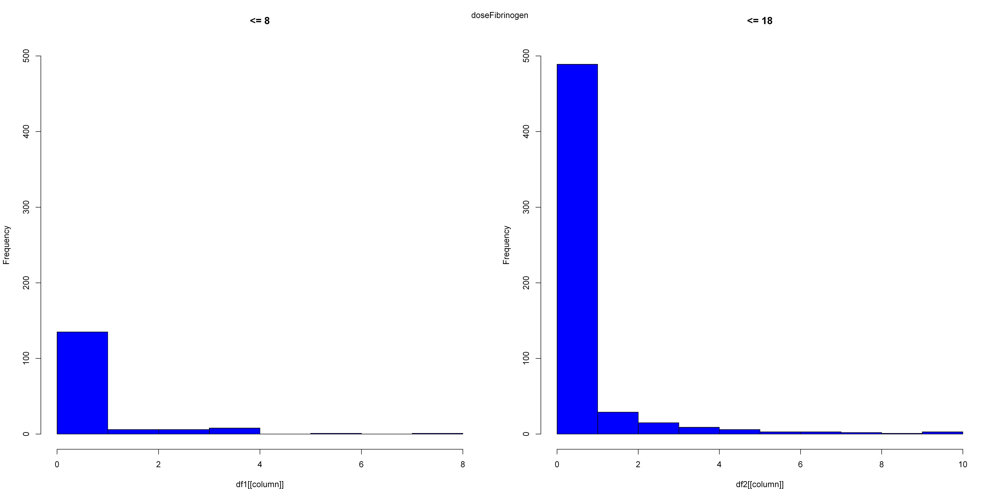

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00    0.00    0.00   37.36    0.00 1433.00 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    0.0     0.0     0.0    61.2     0.0  8426.0 


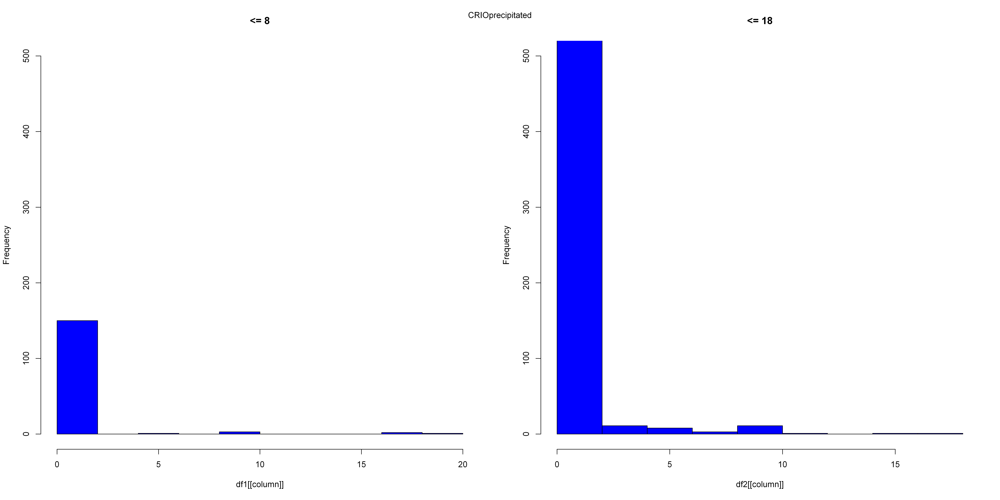

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  -2000    4800    6000    7899    8000  197600 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  -3000    4575    6200    6826    8200   75000 


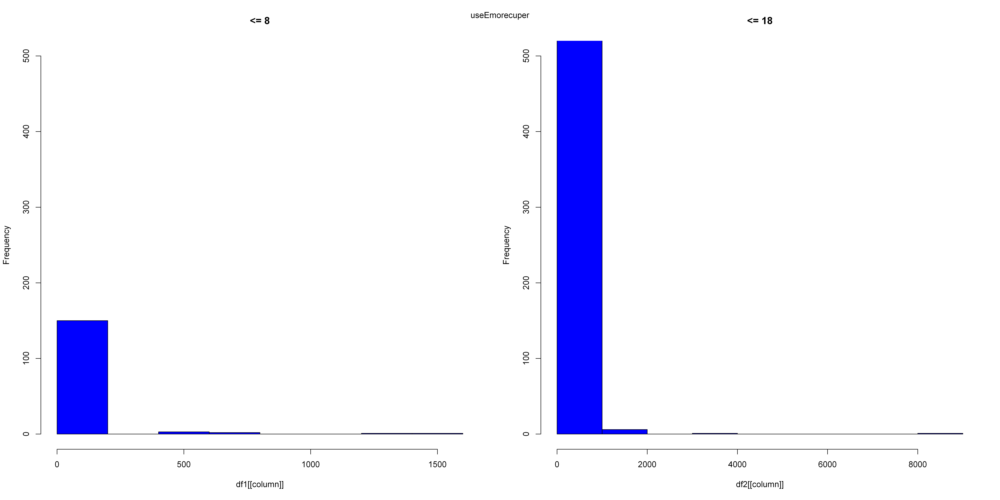

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      0     750    1300    1480    2000    9350 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      0     500    1000    1363    2000    9100 


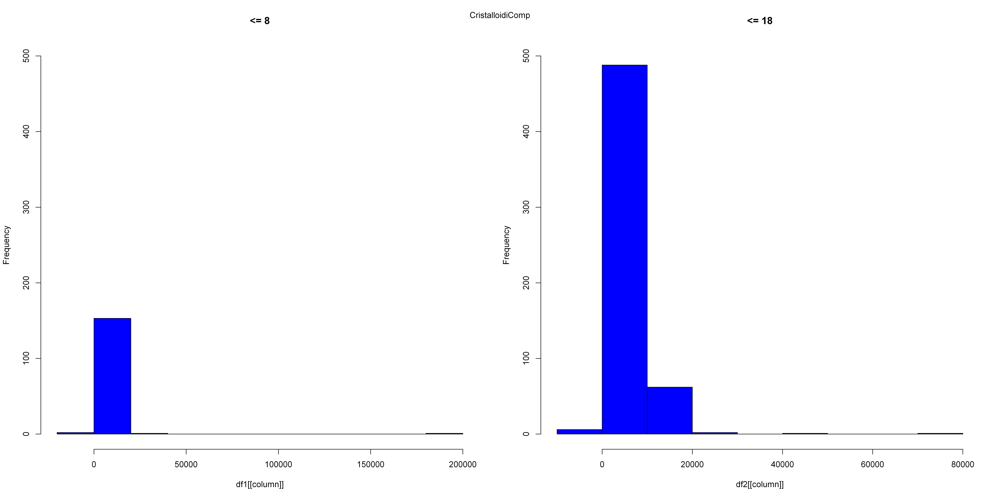

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      0     600    1200    1078    1600    2600 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      0     250    1000    1034    1600    4000 


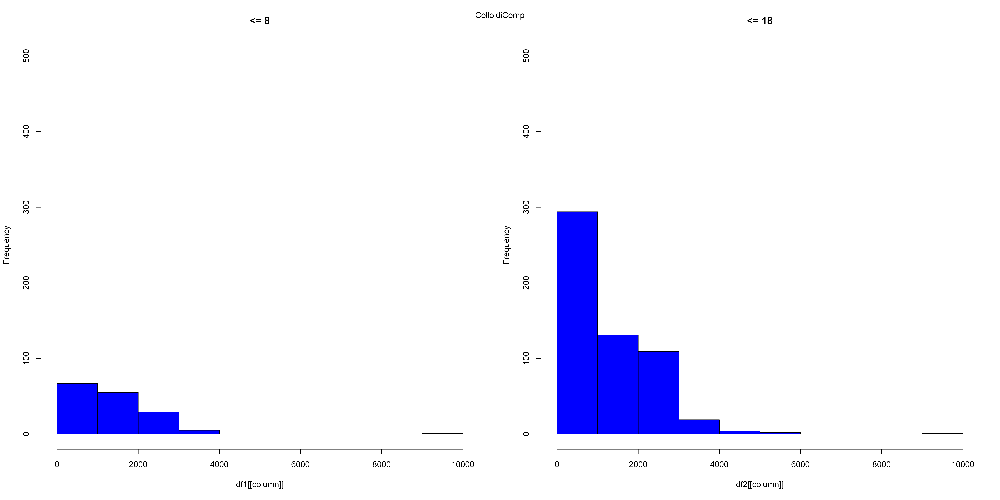

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0500  0.1238  0.2000  1.0000 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0900  0.1395  0.2000  1.5000 


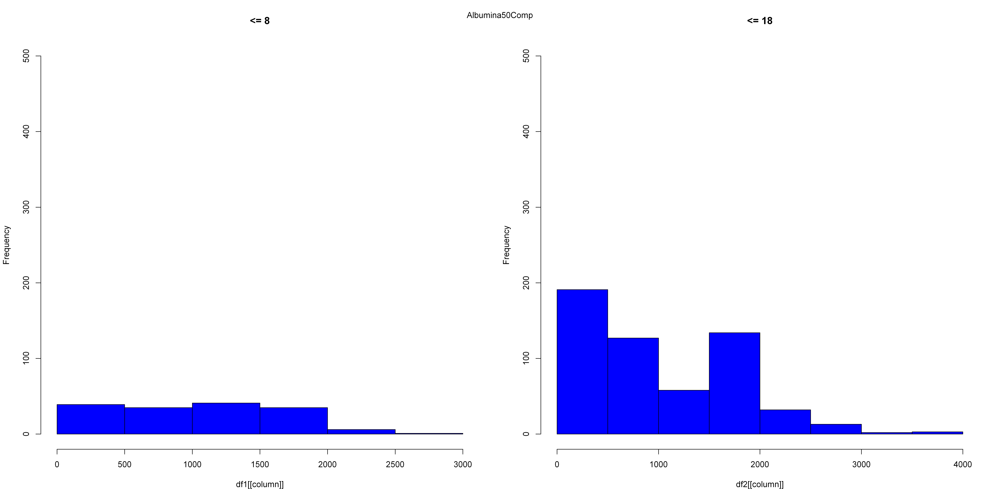

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.600   1.490   2.200   3.424   3.500  19.020 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.500   1.400   2.300   3.071   3.800  24.000 


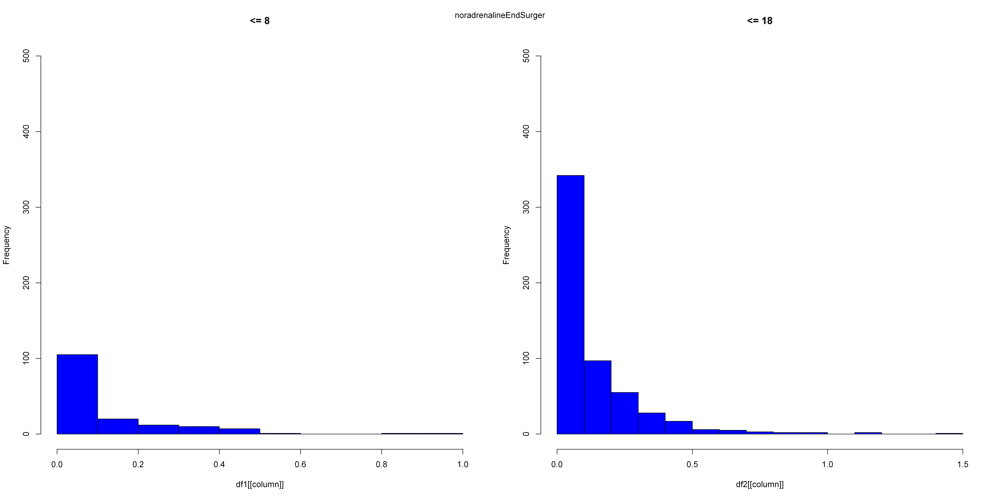

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   63.0   360.0   432.0   438.3   501.0   860.0 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    6.0   360.0   420.0   433.1   495.0  1095.0 


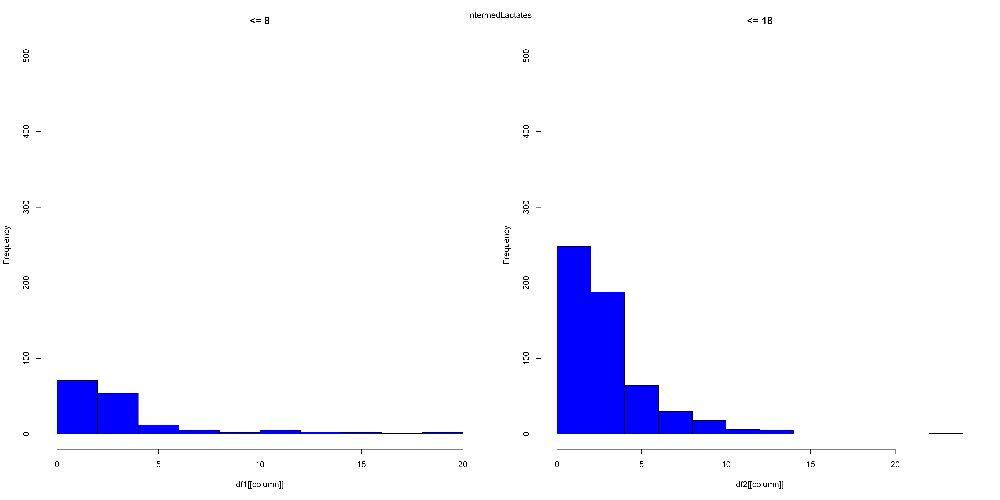

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  19.00   51.00   64.00   62.15   76.00   92.00 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   5.00   51.00   64.00   61.24   74.00   92.00 


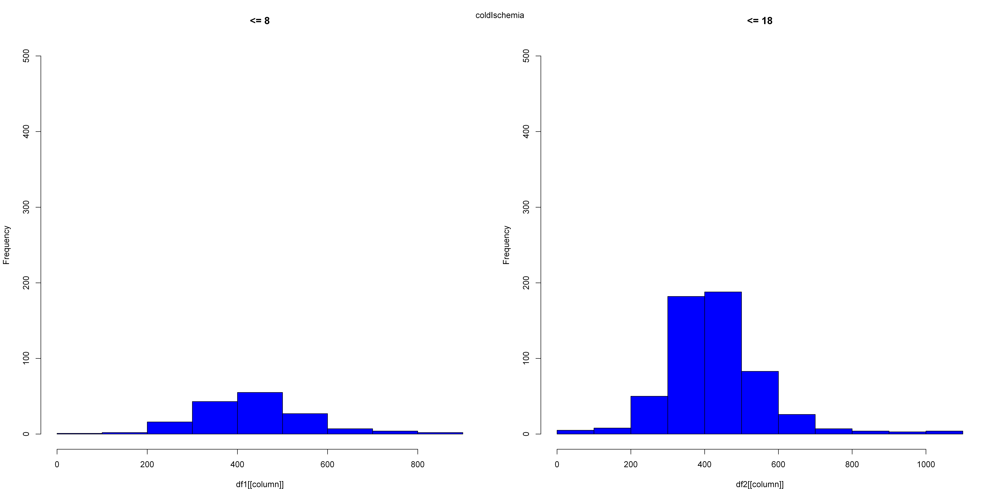

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  150.0   165.0   170.0   169.6   175.0   190.0      15 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   16.0   165.0   170.0   168.8   175.0   200.0     147 


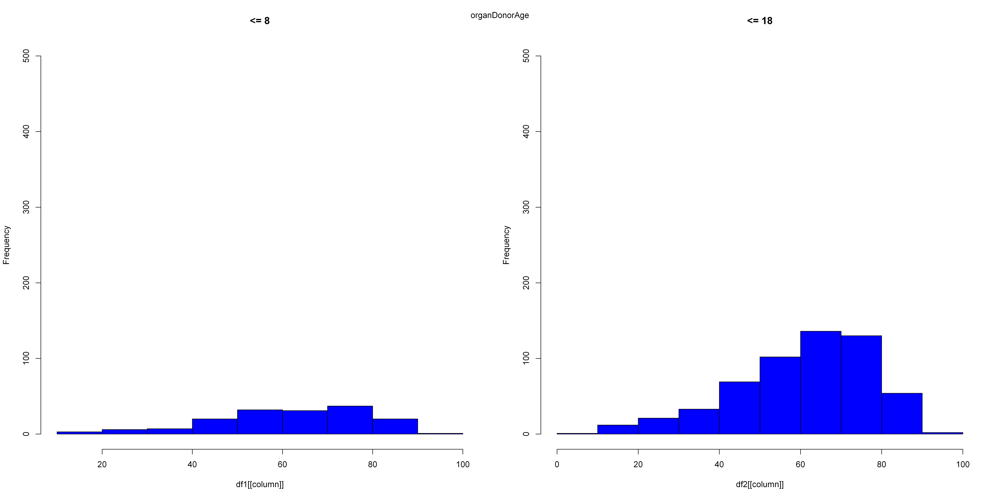

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  129.0   140.2   147.5   147.3   152.0   175.0       7 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  118.0   143.0   148.0   148.7   154.0   178.0      67 


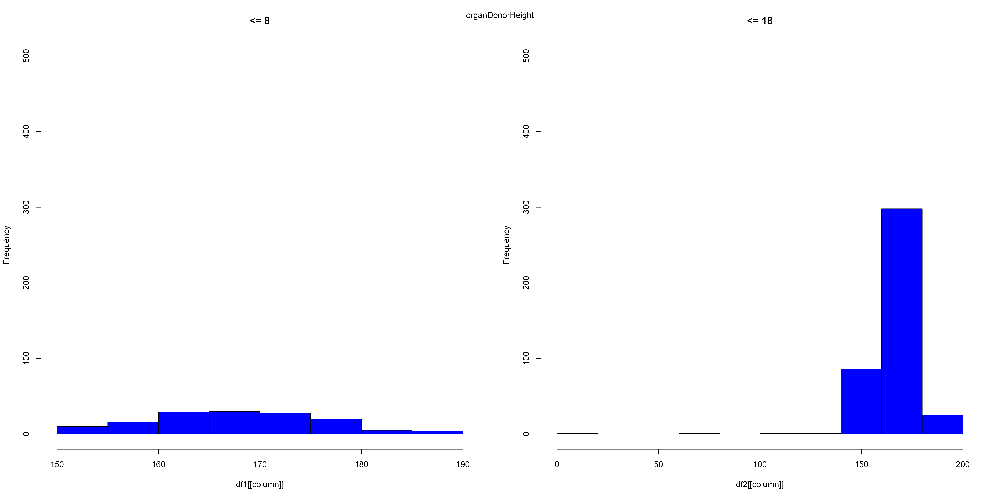

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   6.00   17.00   29.50   79.28   73.25  700.00      19 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   5.00   17.00   33.00   64.81   73.00  700.00     134 


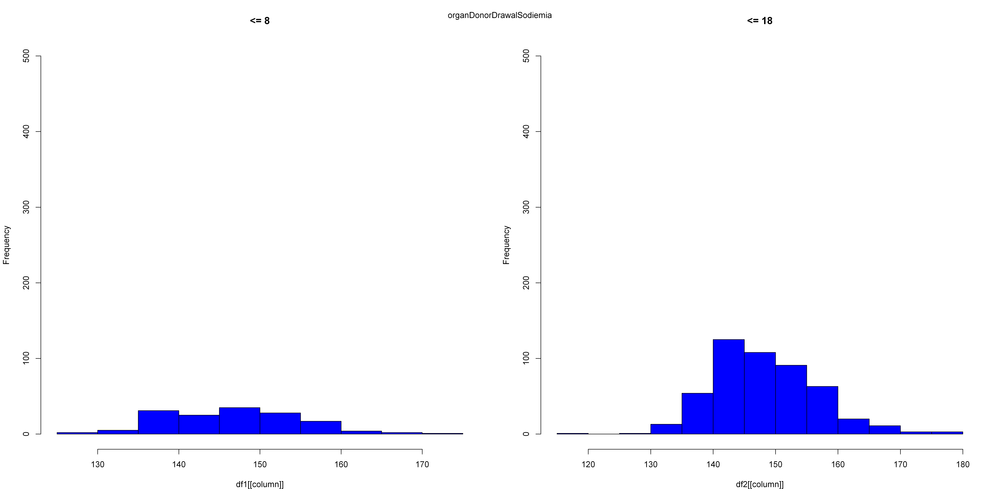

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   5.50    8.00   10.20   11.98   13.51   35.52 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   4.21    9.28   13.63   15.24   18.93   43.66 


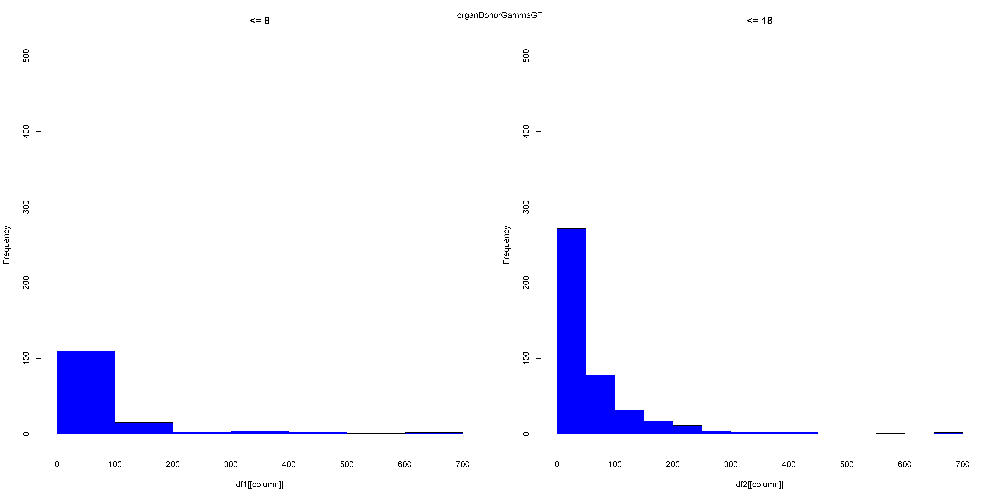

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   2.05    8.31   10.56   12.67   15.10   37.41 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   2.53   10.27   14.98   16.41   21.23   44.21 


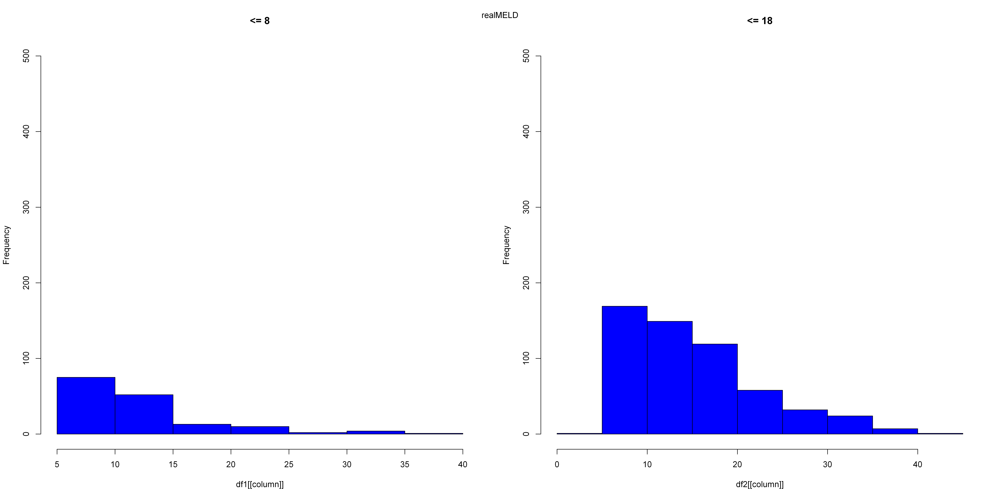

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.190   2.070   2.500   2.530   2.885   4.530      15 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.200   2.070   2.440   2.443   2.700   7.710     147 


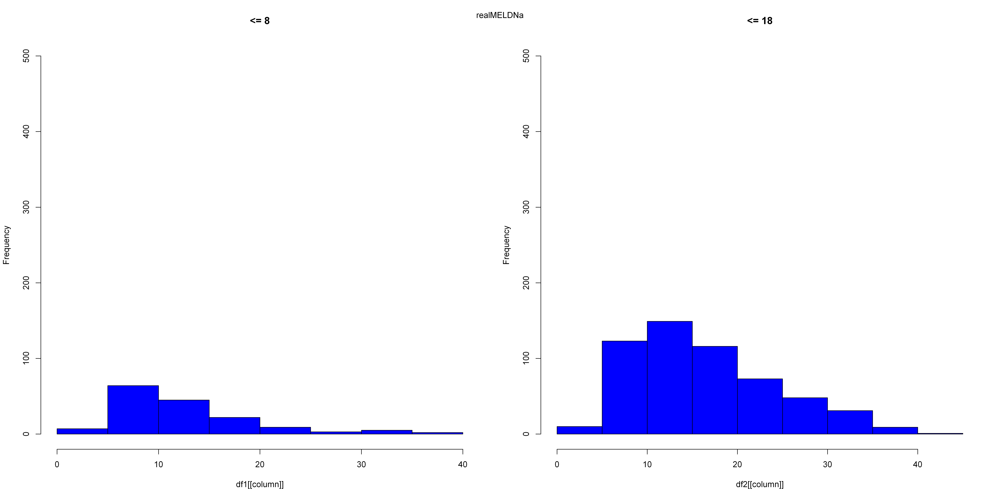

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.130   1.835   2.215   2.213   2.385   3.680      19 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.160   1.820   2.150   2.131   2.310   3.830     134 


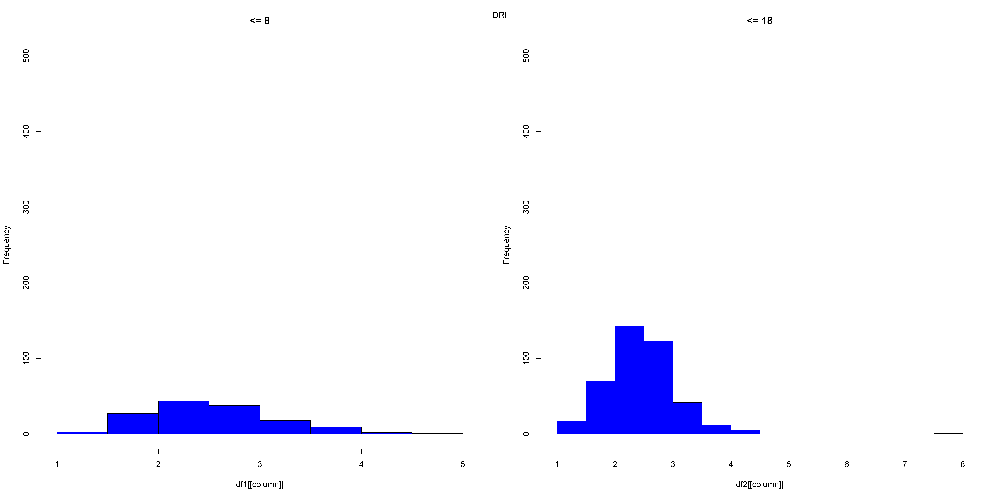

[1] "<= 8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   6.000   7.000   6.631   8.000   8.000 
[1] "<= 18"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    9.0    11.0    13.0    13.1    15.0    18.0 


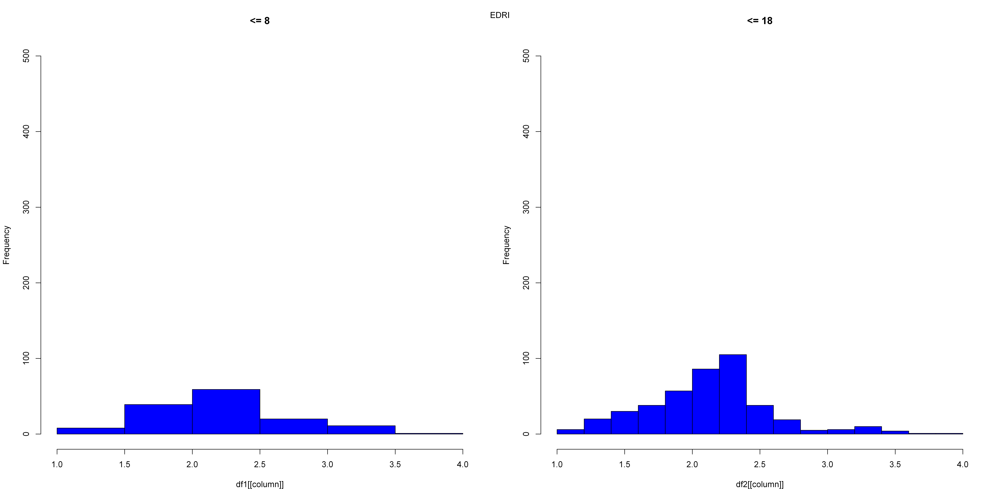

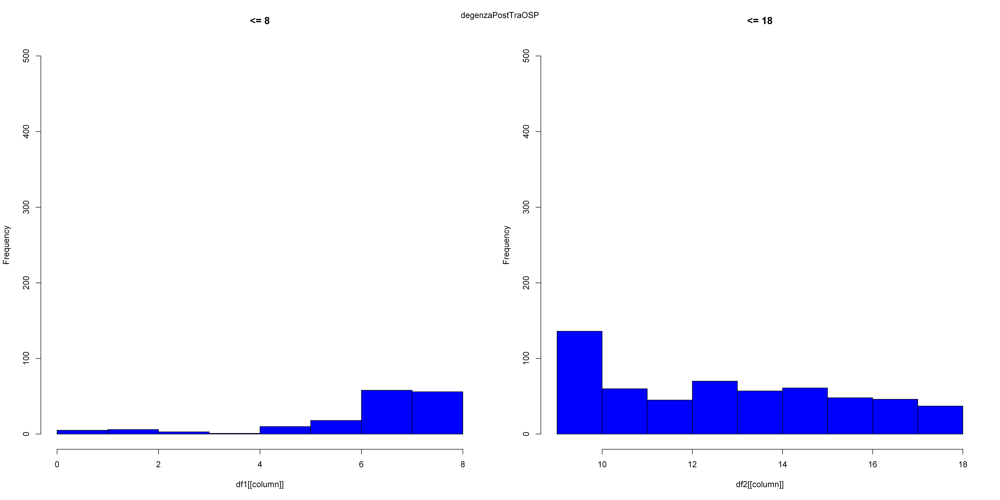

In [32]:
descrittiva_continue(df_continue1, df_continue2)